In [1]:
import os
import numpy as np
import pandas as pd
import scipy.stats
from nptdms import TdmsFile
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.transforms as mtransforms
import matplotlib.font_manager as fm


def import_photometry_data(directory, mouse_id, day):
    """
    Imports photometry data from TDMS files given a directory, mouse ID, and day.
    Returns a dictionary mapping channel names to data if successful, None otherwise.
    """
    filename = os.path.join(directory, f"{mouse_id}_day{day}.tdms")
    if not os.path.exists(filename):
        print(f"File {filename} does not exist.")
        return None
    try:
        tdms_file = TdmsFile.read(filename)
        return {channel.name: channel[:] for group in tdms_file.groups() for channel in group.channels()}
    except Exception as e:
        print(f"Failed to read {filename}: {e}")
        return None

def load_and_preprocess_behavior_data(directory, mouse_id, day):
    """
    Loads and preprocesses behavioral data from LVM files given a directory, mouse ID, and day.
    Returns a DataFrame with the data if successful, None otherwise.
    """
    filepath = os.path.join(directory, f"{mouse_id}_day{day}.lvm")
    if not os.path.exists(filepath):
        print(f"File {filepath} does not exist.")
        return None

    data = pd.read_csv(filepath, header=None)
    columns = ['time', 'odour_a', 'odour_b', 'odour_c', 'lick_data', 'water_valve']
    data.columns = columns[:len(data.columns)]
    return data.dropna(axis=1, how='all')

def find_signal_rises(signal, threshold=2.5):
    """
    Identifies the indices where the signal rises above a specified threshold.
    Returns an array of indices.
    """
    return np.where(np.diff(signal) > threshold)[0]

def classify_trials(all_odours, sampling_rate=1000):
    ITI_points = int(10 * sampling_rate)  # ITI duration in data points
    #2.5 is because the odour lasts 1 second then 1.5 second later reward comes
    trace_points = int(2.5 * sampling_rate)  # Trace duration in data points

    rewarded_pairs = [('A', 'B'), ('B', 'C'), ('C', 'A')]
    non_rewarded_pairs = [('B', 'A'), ('C', 'B'), ('A', 'C')]

    rewarded_trial_indices = []
    non_rewarded_trial_indices = []

    i = 0
    while i < len(all_odours) - 1:
        current_odour, current_index = all_odours[i]
        # Ensure we have a pair to examine
        if i + 1 < len(all_odours):
            next_odour, next_index = all_odours[i + 1]

            # Check if the next odour occurs within the expected ITI duration; otherwise, it's not a valid pair
            if next_index - current_index <= ITI_points:
                trial_end_index = next_index + trace_points  # Calculate the end index after the trace period
                if (current_odour, next_odour) in rewarded_pairs:
                    rewarded_trial_indices.append((current_odour, next_odour, trial_end_index//2))
                elif (current_odour, next_odour) in non_rewarded_pairs:
                    non_rewarded_trial_indices.append((current_odour, next_odour, trial_end_index//2))
            # If the pair spans beyond the ITI, indicating perhaps an incomplete trial or start of a new one, skip ahead
            else:
                i += 1
                continue
        i += 1  # Move to the next pair for examination

    return rewarded_trial_indices, non_rewarded_trial_indices

# Main function to process photometry and behavior data
def process_photometry_data(directory_photometry, directory_behavior, mouse_id, day, beh_sampling_rate=1000, photo_sampling_rate = 500, reward_signal=True):
    pre_reward_secs, post_reward_secs = 10, 5
    baseline_pre_reward_secs = 1.5

    photometry_data = import_photometry_data(directory_photometry, mouse_id, day)
    behavior_data = load_and_preprocess_behavior_data(directory_behavior, mouse_id, day)
    if photometry_data is None or behavior_data is None:
        print(f"Failed to load data for mouse {mouse_id}.")
        return None

    odour_a_indices = find_signal_rises(behavior_data['odour_a'].values)
    odour_b_indices = find_signal_rises(behavior_data['odour_b'].values)
    odour_c_indices = find_signal_rises(behavior_data['odour_c'].values)

    all_odours = sorted([('A', idx) for idx in odour_a_indices] +
                        [('B', idx) for idx in odour_b_indices] +
                        [('C', idx) for idx in odour_c_indices], key=lambda x: x[1])

    rewarded_trial_indices, non_rewarded_trial_indices = classify_trials(all_odours, beh_sampling_rate)

    pre_reward_points, post_reward_points = int(pre_reward_secs * photo_sampling_rate), int(post_reward_secs * photo_sampling_rate)
    baseline_pre_reward_points = int(baseline_pre_reward_secs * photo_sampling_rate)

    ach_signals = {'PFC': [], 'HPC': []}

    for trial in (rewarded_trial_indices if reward_signal else non_rewarded_trial_indices):
        _, _, trial_end_index = trial
        for area, channel_name in [('PFC', 'Voltage_0 (Filtered)'), ('HPC', 'Voltage_1 (Filtered)')]:
            if channel_name in photometry_data:
                # Corrected calculation for start and end using trial_end_index instead of dividing a tuple
                start, end = max(trial_end_index - pre_reward_points, 0), trial_end_index + post_reward_points
                baseline_end = start + baseline_pre_reward_points
                segment = photometry_data[channel_name][start:end]
                if len(segment) == pre_reward_points + post_reward_points:
                    baseline_mean = np.mean(photometry_data[channel_name][start:baseline_end])
                    ach_signals[area].append(segment - baseline_mean)

    return ach_signals

# Core Plotting Utilities

In [2]:
"""
These functions provide the fundamental plotting capabilities used to visualize data for individual experiments, areas, or conditions. They are designed to be reusable and adaptable across various analysis routines.
"""

def plot_area_signals(area, signal_list, time_axis, colors, day_of_interest, added_legends):
    """
    Plots the signals for a specific brain area, marking key events with vertical lines.
    Ensures no duplicate legend entries for overlaid plots.

    Parameters:
    - area: Brain area to plot.
    - signal_list: Signals to plot.
    - time_axis: Time axis for the plot.
    - colors: Color mapping for each area.
    - day_of_interest: Day for the plot title.
    - added_legends: Set to track added legend entries to avoid duplicates.
    """
    if not signal_list:
        return

    signals_stack = np.vstack(signal_list)
    mean_signal = signals_stack.mean(axis=0)
    sem_signal = scipy.stats.sem(signals_stack, axis=0)
    color = colors.get(area, 'black')

    label = f'{area} Mean Signal'
    if label not in added_legends:
        plt.plot(time_axis, mean_signal, label=label, color=color, linewidth=2)
        added_legends.add(label)
    else:
        plt.plot(time_axis, mean_signal, color=color, linewidth=2)

    plt.fill_between(time_axis, mean_signal - sem_signal, mean_signal + sem_signal, alpha=0.2, color=color)

    events = [(0, 'red', 'Reward Onset'), (-2.5, 'purple', 'Second Odour Onset'), (-8.5, 'magenta', 'First Odour Onset')]
    for x, event_color, label in events:
        if label not in added_legends:
            plt.axvline(x=x, color=event_color, linestyle='--', linewidth=2, label=label)
            added_legends.add(label)
        else:
            plt.axvline(x=x, color=event_color, linestyle='--', linewidth=2)

def plot_signals(signals, pre_reward_secs, post_reward_secs, mouse_ids, overlay, day_of_interest, title):
    """
    Plots signals for each brain area, with options to overlay signals and specify the day of interest.
    Adjusted to handle the overlay parameter correctly for separate plotting of brain areas.

    Parameters:
    - signals: Signals to plot, categorized by brain area.
    - pre_reward_secs: Seconds before the reward event to include.
    - post_reward_secs: Seconds after the reward event to include.
    - mouse_ids: Identifiers for the mice included in the plot.
    - overlay: Whether to overlay plots for different brain areas.
    - day_of_interest: The specific day of interest for plotting.
    - title: Custom title for the plot based on analysis context.
    """
    time_axis = np.linspace(-pre_reward_secs, post_reward_secs, num=(pre_reward_secs + post_reward_secs) * 500)
    colors = {'PFC': 'blue', 'HPC': 'green'}
    added_legends = set()

    if overlay:
        # Plotting all areas on the same figure if overlay is True
        plt.figure(figsize=(12, 8))
        for area, signal_list in signals.items():
            if signal_list:
                plot_area_signals(area, signal_list, time_axis, colors, day_of_interest, added_legends)
        plt.title(title, fontsize=20, fontweight='bold')
        finalize_plot()
    else:
        # Creating separate plots for each area when overlay is False
        for area, signal_list in signals.items():
            if signal_list:
                plt.figure(figsize=(12, 8))
                plot_area_signals(area, signal_list, time_axis, colors, day_of_interest, added_legends)
                plt.title(f"{title} in {area}", fontsize=20, fontweight='bold')
                finalize_plot()

def finalize_plot():
    """
    Finalizes the plot with common settings.
    """
    plt.xlabel('Time (s)', fontsize=16, fontweight='bold')
    plt.ylabel('Signal Amplitude', fontsize=16, fontweight='bold')
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend(fontsize=14)
    plt.tight_layout()
    plt.show()



# Main Analysis and Overview Plotting Driver functions 

In [10]:
"""
These functions perform comprehensive analysis across multiple datasets or time points, and generate high-level summary plots to visualize the results.
"""

def compare_signals_across_mice(mouse_ids, day, overlay=True, reward_signal=True):
    """
    Compares and plots signals across mice for a given day, adjusting the plot details
    based on the number of mice and the type of signals (rewarded vs. non-rewarded).

    Parameters:
    - mouse_ids (list): List of mouse identifiers.
    - day (int): Day of interest.
    - overlay (bool): Whether to overlay plots for different brain areas.
    - reward_signal (bool): Analyze and plot signals related to rewards if True, otherwise analyze non-rewarded signals.
    """
    all_signals = {'PFC': [], 'HPC': []}  # Dictionary to store signals for each area.
    pre_reward_secs, post_reward_secs = 10, 5

    for mouse_id in mouse_ids:
        signals = process_photometry_data('/Users/chenx/Desktop/MacAskill Lab/Data/My_Rig_Data/Photometry', '/Users/chenx/Desktop/MacAskill Lab/Data/My_Rig_Data/Behaviour', mouse_id, day, reward_signal=reward_signal)
        if signals:
            for area in all_signals:
                all_signals[area].extend(signals.get(area, []))

    # Determine the plot title based on the number of mice and the signal type
    title_base = "ACh Signal around "
    title_base += "Rewards" if reward_signal else "Non-Rewards"
    if len(mouse_ids) == 1:
        title = f"{mouse_ids[0]} {title_base} on Day {day}"
    else:
        title = f"Mean {title_base} for Multiple Mice on Day {day}"

    plot_signals(all_signals, pre_reward_secs, post_reward_secs, mouse_ids, overlay, day, title)
    
    # Adding vertical lines for specific events
    events = [
        (0, 'green', 'Reward Onset'),
        (-2.5, 'purple', 'Second Odour Onset'),
        (-8.5, 'magenta', 'First Odour Onset'),
    ]
    for x, color, label in events:
        plt.axvline(x=x, color=color, linestyle='--', linewidth=3, label=label)

def plot_signals_across_days(mouse_ids, days_of_interest, area_of_interest):
    """
    Plot average signal traces for both rewarded and non-rewarded signals in a specified brain area across multiple days,
    with vertical lines indicating specific events. Rewarded signals and non-rewarded signals are plotted with different colors
    or line styles for distinction.
    
    Parameters:
    - mouse_ids (list): List of mouse identifiers.
    - days_of_interest (list): Days to include in the plot.
    - area_of_interest (str): Specific brain area to plot (e.g., 'HPC').
    """
    plt.figure(figsize=(15, 8))
    time_axis = np.linspace(-10, 5, num=(10 + 5) * 500)  # Assuming pre_reward_secs=10, post_reward_secs=5, sampling_rate=1000

    # Generate colormaps for rewarded and non-rewarded signals
    cmap_rewarded = cm.get_cmap('Greens', len(days_of_interest))
    cmap_non_rewarded = cm.get_cmap('Reds', len(days_of_interest))

    for idx, day in enumerate(days_of_interest):
        for reward_signal, cmap, label_prefix in zip([True, False], [cmap_rewarded, cmap_non_rewarded], ['Rewarded', 'Non-Rewarded']):
            day_signals = []  # Store signals for this day
            for mouse_id in mouse_ids:
                signals = process_photometry_data('/Users/chenx/Desktop/MacAskill Lab/Data/My_Rig_Data/Photometry', '/Users/chenx/Desktop/MacAskill Lab/Data/My_Rig_Data/Behaviour', mouse_id, day, reward_signal=reward_signal)
                if signals and area_of_interest in signals:
                    day_signals.extend(signals[area_of_interest])

            if day_signals:
                avg_signal = np.mean(np.vstack(day_signals), axis=0)
                color = cmap(idx)  # Use the colormap index to get a unique color for each day
                plt.plot(time_axis, avg_signal, label=f"{label_prefix} Day {day}", alpha=0.6, color=color)

    # Adding vertical lines for specific events
    events = [
        (0, '#fd7e14', 'Reward Onset'),
        (-2.5, '#6f42c1', 'Second Odour Onset'),
        (-8.5, '#18A558', 'First Odour Onset'),
    ]

    for x, color, label in events:
        plt.axvline(x=x, color=color, linestyle='--', linewidth=3, label=label)

    title = f"Mean ACh Signals for {area_of_interest} Across Days for All Mice"
    plt.title(title, fontsize=14, fontweight='bold')
    plt.xlabel('Time (s)', fontweight='bold')
    plt.ylabel('Signal Amplitude', fontweight='bold')
    plt.legend()
    
    plt.show()


def plot_average_signals_across_days(mouse_ids, days_of_interest, area_of_interest, reward_signal=True):
    """
    Plot average signal traces for a specified brain area across multiple days,
    with vertical lines indicating specific events, using a color gradient to indicate time progression.
    
    Parameters:
    - mouse_ids (list): List of mouse identifiers.
    - days_of_interest (list): Days to include in the plot.
    - area_of_interest (str): Specific brain area to plot (e.g., 'HPC').
    - reward_signal (bool): Indicates whether the signals are around rewards (True) or non-rewards (False).
    """
    plt.figure(figsize=(12, 8))
    time_axis = np.linspace(-10, 5, num=(10 + 5) * 500)  # Assuming pre_reward_secs=10, post_reward_secs=5, sampling_rate=1000

    # Generate a colormap and select colors from it
    cmap = cm.get_cmap('viridis', len(days_of_interest))
    

    for idx, day in enumerate(days_of_interest):
        day_signals = []  # Store signals for this day
        for mouse_id in mouse_ids:
            signals = process_photometry_data('/Users/chenx/Desktop/MacAskill Lab/Data/My_Rig_Data/Photometry', '/Users/chenx/Desktop/MacAskill Lab/Data/My_Rig_Data/Behaviour', mouse_id, day, reward_signal=reward_signal)
            if signals and area_of_interest in signals:
                day_signals.extend(signals[area_of_interest])

        if day_signals:
            avg_signal = np.mean(np.vstack(day_signals), axis=0)
            color = cmap(idx)  # Use the colormap index to get a unique color for each day
            plt.plot(time_axis, avg_signal, label=f"Day {day}", alpha=0.65, color=color)

    # Adding vertical lines for specific events
    events = [
        (0, '#fd7e14', 'Reward Onset'),
        (-2.5, '#6f42c1', 'Second Odour Onset'),
        (-8.5, '#18A558', 'First Odour Onset'),
    ]
    
    for x, color, label in events:
        plt.axvline(x=x, color=color, linestyle='--', linewidth=3, label=label)

    # Determine the title based on reward_signal and other parameters
    signal_type_text = "Reward" if reward_signal else "Non-Reward"
    if len(mouse_ids) == 1:
        title = f"ACh Signals for {area_of_interest} Around {signal_type_text} for Mouse {mouse_ids[0]}"
    else:
        title = f"ACh Signals for {area_of_interest} Around {signal_type_text} for {len(mouse_ids)} Mice"
    
    # Apply the dynamically determined title to the plot
    plt.title(title, fontsize=16, fontweight='bold')

# Scale bar settings
    x_scale_length = 1  # 1 second
    y_scale_length = 0.001  # 0.001 ΔF/F
    scale_bar_loc = (-10, -0.01)  # Adjust this location based on your plot
    plt.axhline(y = 0, linestyle = '--', color = 'black',lw=3, alpha=0.7)
    plt.plot([scale_bar_loc[0], scale_bar_loc[0] + x_scale_length], [scale_bar_loc[1], scale_bar_loc[1]], 'k-', lw=3)
    plt.text(scale_bar_loc[0] + x_scale_length / 2, scale_bar_loc[1], '1 s', ha='center', va='bottom')
    plt.plot([scale_bar_loc[0], scale_bar_loc[0]], [scale_bar_loc[1], scale_bar_loc[1] + y_scale_length], 'k-', lw=3)
    plt.text(scale_bar_loc[0], scale_bar_loc[1] + y_scale_length / 2, '0.001 ∆F/F', ha='right', va='center', rotation='vertical')
    plt.ylim(-0.011, 0.006)  # Adjust as necessary
    plt.xlabel('Time (s)', fontweight='bold')
    plt.ylabel('Signal Amplitude', fontweight='bold')
    # Turn off the grid
    plt.grid(False)

    # Hide top and right border
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)

    # Hide bottom and left border
    plt.gca().spines['bottom'].set_visible(False)
    plt.gca().spines['left'].set_visible(False)

    # Remove x and y axis ticks
    plt.xticks([])
    plt.yticks([])

    # Hide the x and y axis labels
    plt.xlabel('')
    plt.ylabel('')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()


def plot_rewarded_and_nonrewarded_signals(mouse_ids, day):
    areas = ['HPC', 'PFC']
    signals = {area: {'rewarded': [], 'non_rewarded': []} for area in areas}

    # Data aggregation
    for mouse_id in mouse_ids:
        for reward_signal in [True, False]:
            ach_signals = process_photometry_data('/Users/chenx/Desktop/MacAskill Lab/Data/My_Rig_Data/Photometry', '/Users/chenx/Desktop/MacAskill Lab/Data/My_Rig_Data/Behaviour', mouse_id, day, reward_signal=reward_signal)
            if ach_signals:
                for area in areas:
                    signal_type = 'rewarded' if reward_signal else 'non_rewarded'
                    signals[area][signal_type].extend(ach_signals.get(area, []))

    time_axis = np.linspace(-10, 5, num=(10 + 5) * 500)

    # Calculate the minimum y-value from the mean of all signals for positioning the scale bar
    mean_values = []
    for area in signals:
        for signal_type in signals[area]:
            if signals[area][signal_type]:  # Ensure there are signals to process
                all_signals = np.array(signals[area][signal_type])
                mean_signal = np.mean(all_signals, axis=0)
                mean_values.append(np.min(mean_signal))

    if not mean_values:
        print("No signals found. Check your data processing steps.")
        return

    min_y_value_mean_based = min(mean_values)
    
    # Adjust the y-coordinate for the scale bar location to be just below the lowest signal value
    for area in areas:
        fig, ax = plt.subplots(figsize=(15, 10))
        handles, labels = [], []  # To store handles and labels for the legend
        # Variables for scale bars
        x_scale_length = 1  # 1 second
        y_scale_length = 0.001  # 0.001 ΔF/F
        scale_bar_loc = (-10, -0.011) 

        # Drawing a horizontal line at y = 0
        # ax.axhline(y=0, linestyle='--', color='0.4', lw=3)

        # Drawing a vertical line at x = -10
        # ax.axvline(x=-10.5, linestyle='--', color='0.4', lw=3)

        for signal_type, color, label in zip(['rewarded', 'non_rewarded'], ['#01949A', '#DB1F48'], ['Rewarded', 'Non-Rewarded']):
            all_signals = np.array(signals[area][signal_type])
            if all_signals.size > 0:
                mean_signal = np.mean(np.vstack(all_signals), axis=0)
                sem_signal = scipy.stats.sem(np.vstack(all_signals), axis=0)

                # Plotting the mean signal line and SEM shading
                line, = ax.plot(time_axis, mean_signal, color=color, linewidth=3, alpha=0.6)
                ax.fill_between(time_axis, mean_signal-sem_signal, mean_signal+sem_signal, color=color, alpha=0.3)
                handles.append(line)
                labels.append(label)

        # Plotting event lines
        event_colors = ['#fd7e14', '#6f42c1', '#18A558']
        event_labels = ['Reward Onset', 'Second Odour Onset', 'First Odour Onset']
        event_times = [0, -2.5, -8.5]

        for time, color, label in zip(event_times, event_colors, event_labels):
            line = ax.axvline(x=time, color=color, linestyle='--', linewidth=3, alpha = 0.7)
            handles.append(line)
            labels.append(label)

        # Setting titles and labels
        mouse_ids_str = ', '.join(mouse_ids) if len(mouse_ids) > 1 else mouse_ids[0]
        ax.set_title(f"{area} Signals: Rewarded vs. Non-Rewarded Trials\nMouse IDs: {mouse_ids_str} | Day {day}", fontsize=20, fontweight='bold', pad=20)
        ax.set_xlabel('Time (s)', fontsize=18, fontweight='bold')
        ax.set_ylabel('Signal Amplitude', fontsize=18, fontweight='bold')
        ax.tick_params(axis='both', which='major', labelsize=16)
        ax.grid(True, which='both', linestyle='--', linewidth=0.5)

        # Adding scale bars
        # X-axis scale bar
        ax.plot([scale_bar_loc[0], scale_bar_loc[0] + x_scale_length], [scale_bar_loc[1], scale_bar_loc[1]], 'k-', lw=3)
        ax.text(scale_bar_loc[0] + x_scale_length / 2, scale_bar_loc[1], '1 s', ha='center', va='bottom')

        # Y-axis scale bar
        ax.plot([scale_bar_loc[0], scale_bar_loc[0]], [scale_bar_loc[1], scale_bar_loc[1] + y_scale_length], 'k-', lw=3)
        ax.text(scale_bar_loc[0], scale_bar_loc[1] + y_scale_length / 2, '0.001 ∆F/F', ha='right', va='center', rotation='vertical')

        # plt.axvline(x = 0, linestyle = '--', color = 'blue',lw=3)
        plt.axhline(y = 0, linestyle = '--', color = 'black',lw=3, alpha=0.6)
        plt.ylim(-0.015, 0.006)
        # Place the legend at the top right inside the plot, but away from the corner
        ax.legend(handles, labels, fontsize=14, loc=(-0.2, 0.85), frameon=False) # Adjust the tuple (0.7, 0.9) as needed

        ax.axis('off')
        # Display the plot
        plt.show()




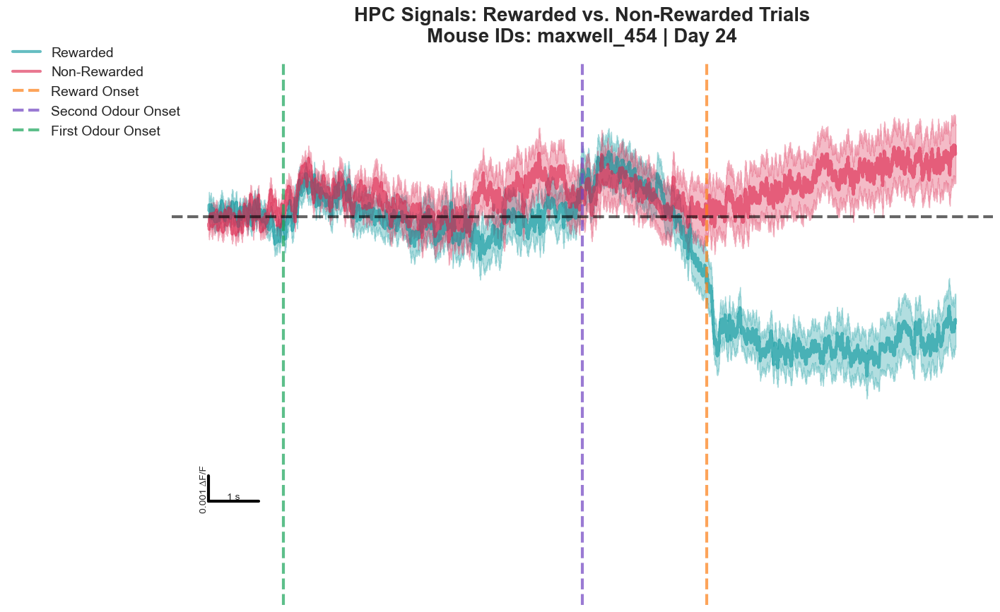

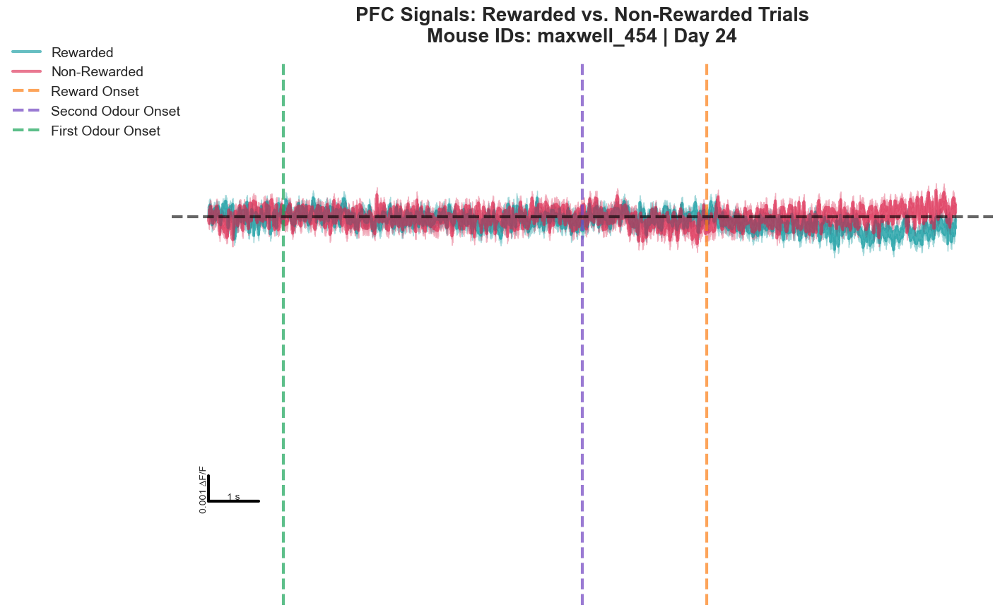

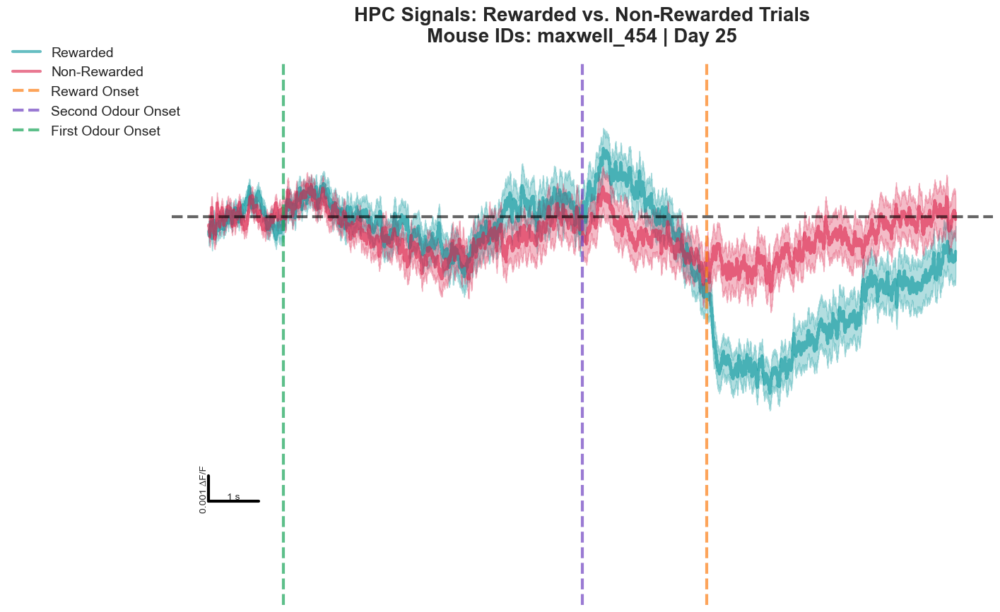

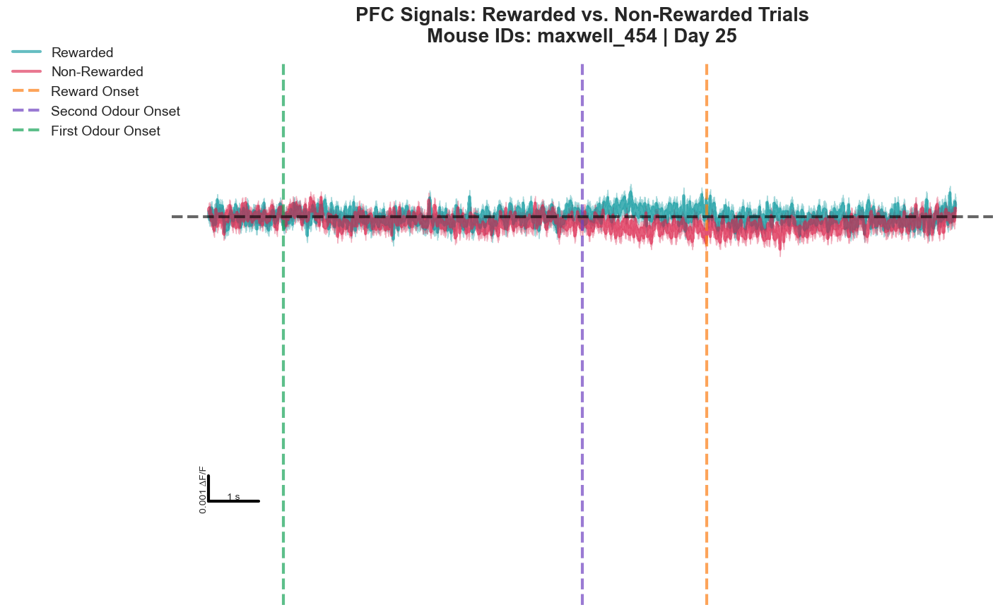

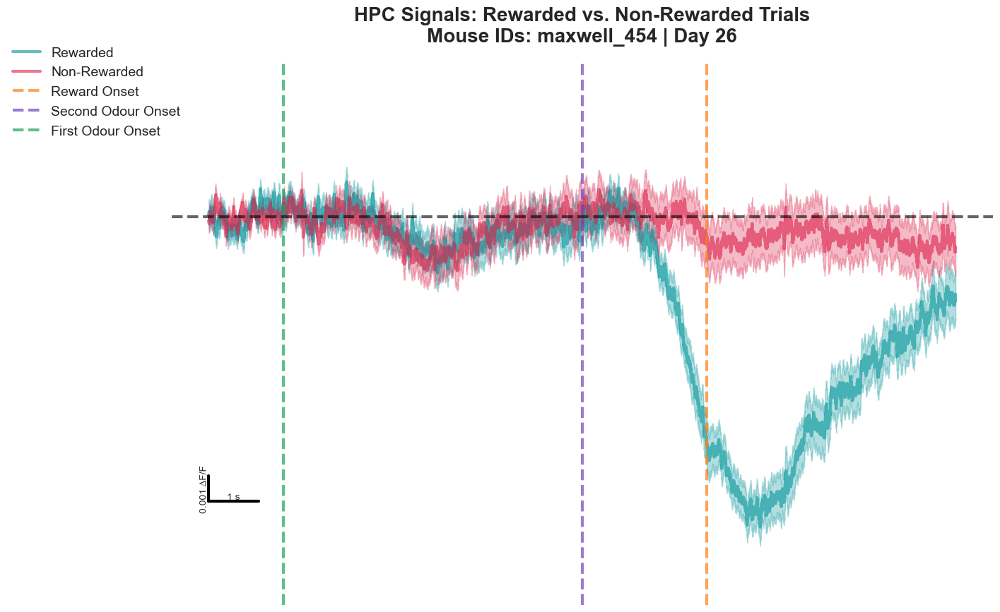

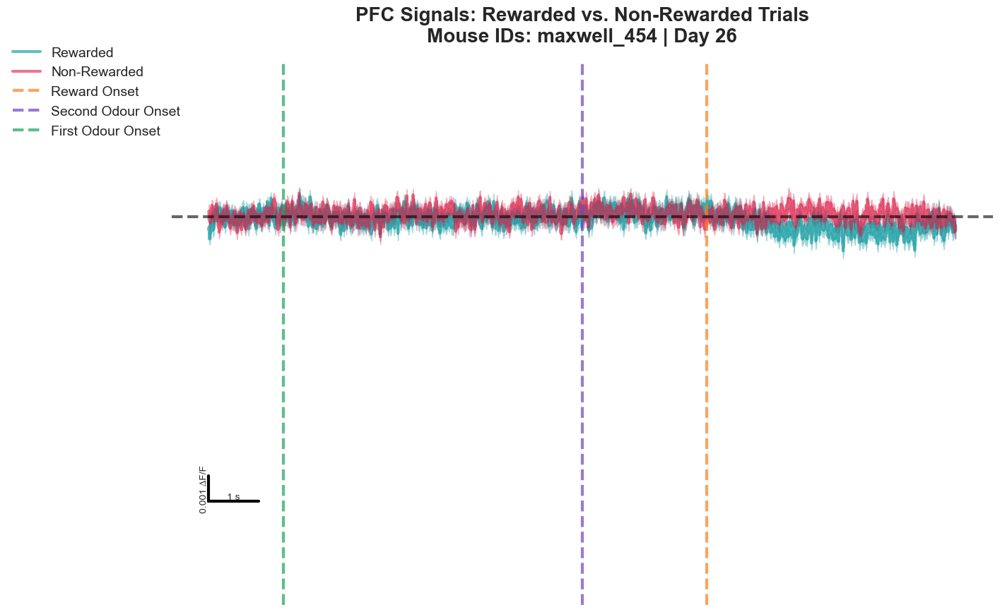

In [12]:
mouse_ids = ['maxwell_454']
# 14: 51%, 17: 56.9%, 18: 78.3% ,19:90.97%
days_of_interest = [24,25,26]

for day in days_of_interest:
    plot_rewarded_and_nonrewarded_signals(mouse_ids, day)

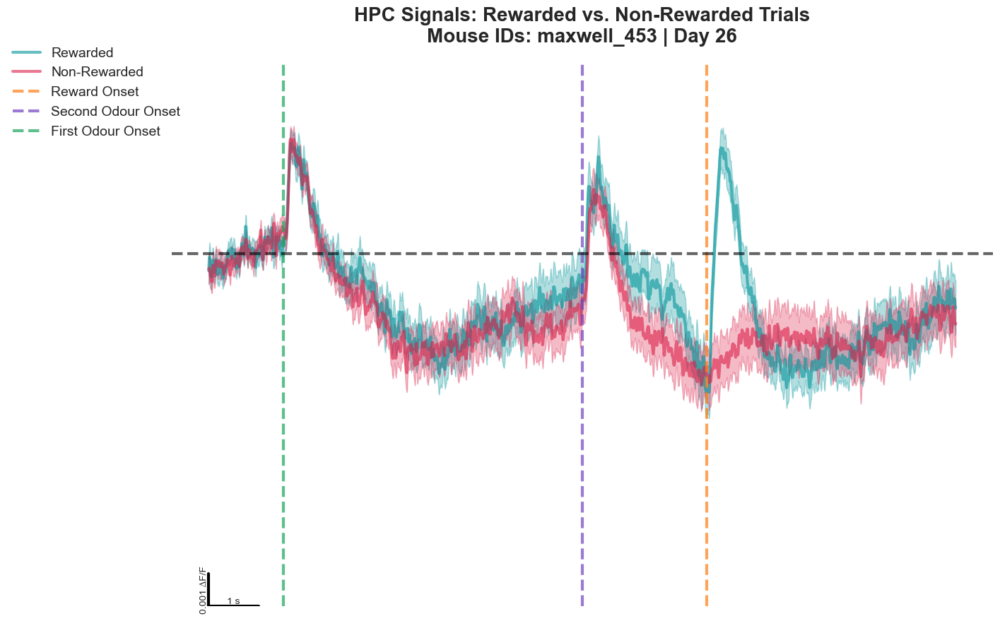

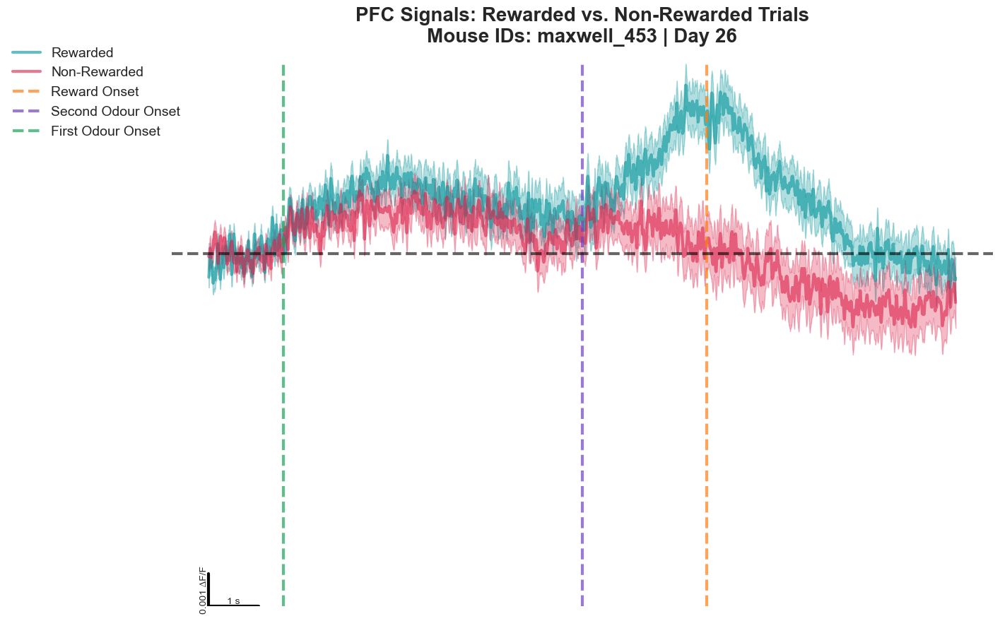

In [4]:
mouse_ids = ['maxwell_453']
# 14: 51%, 17: 56.9%, 18: 78.3% ,19:90.97%
days_of_interest = [26]

for day in days_of_interest:
    plot_rewarded_and_nonrewarded_signals(mouse_ids, day)

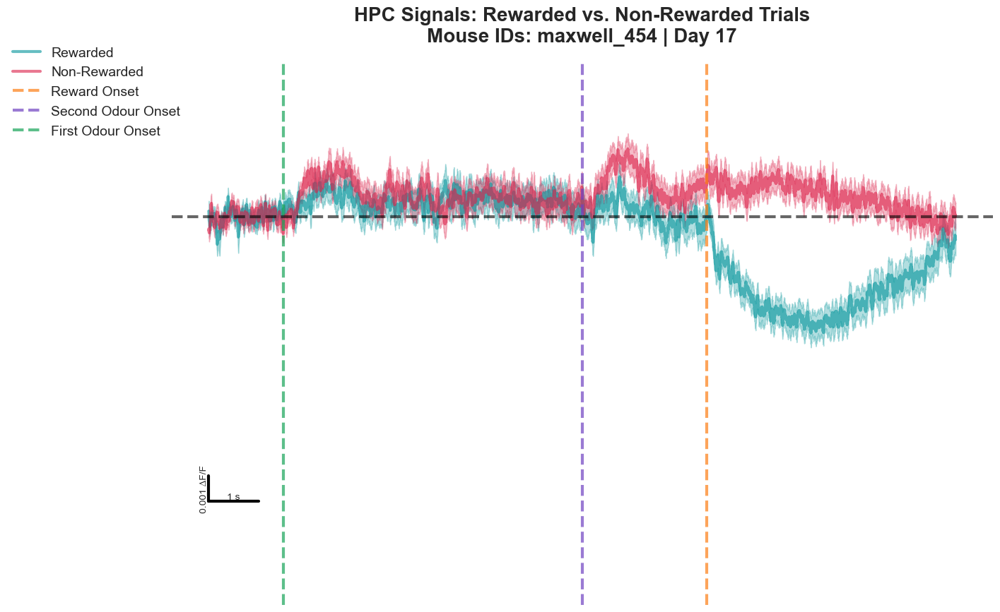

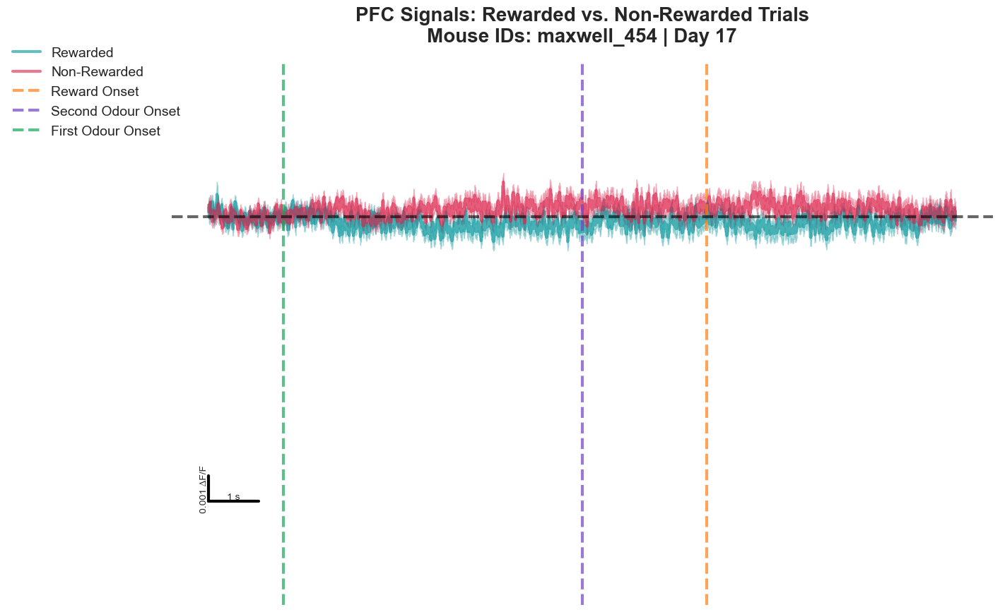

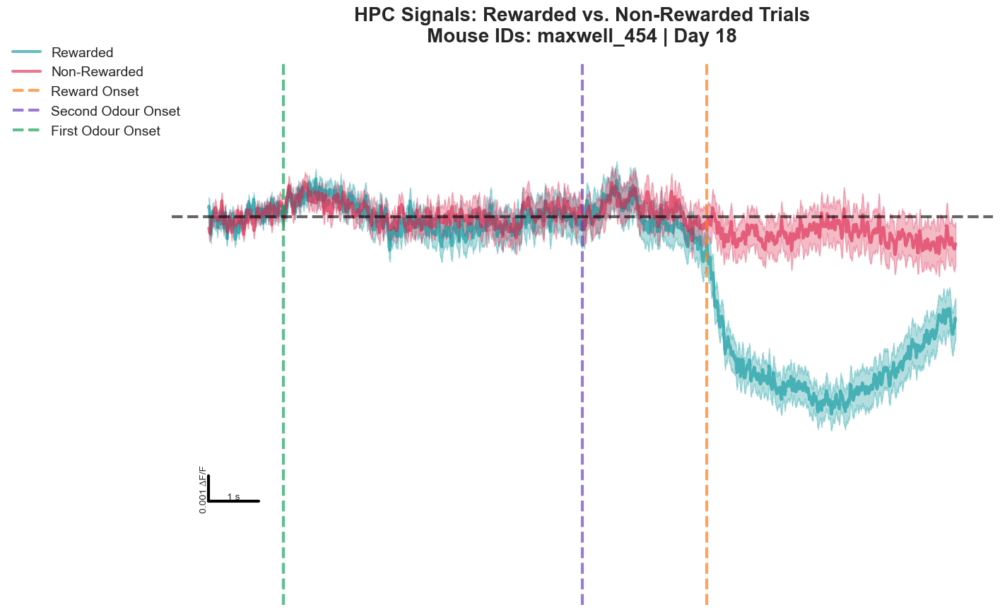

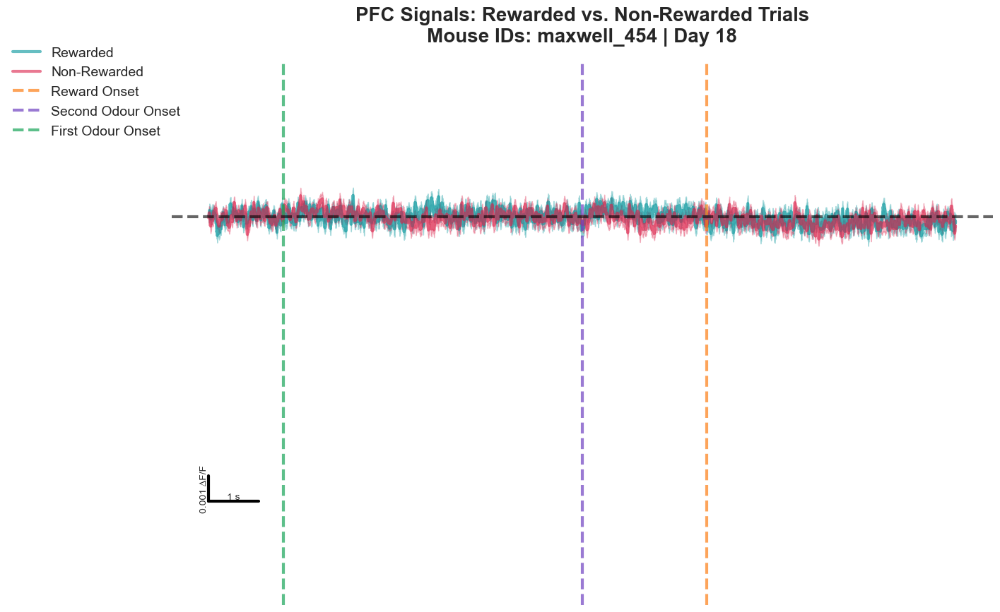

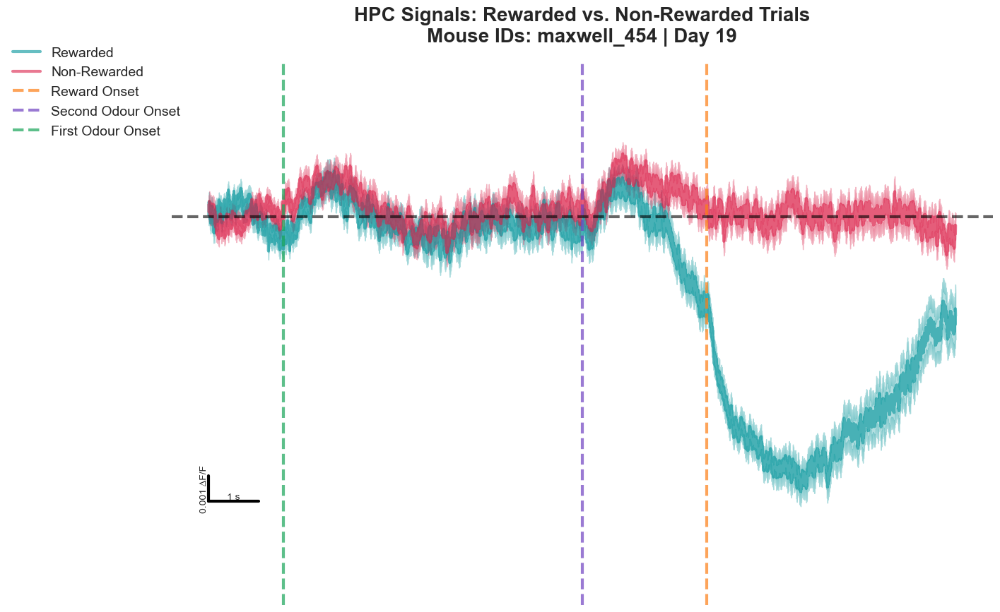

...

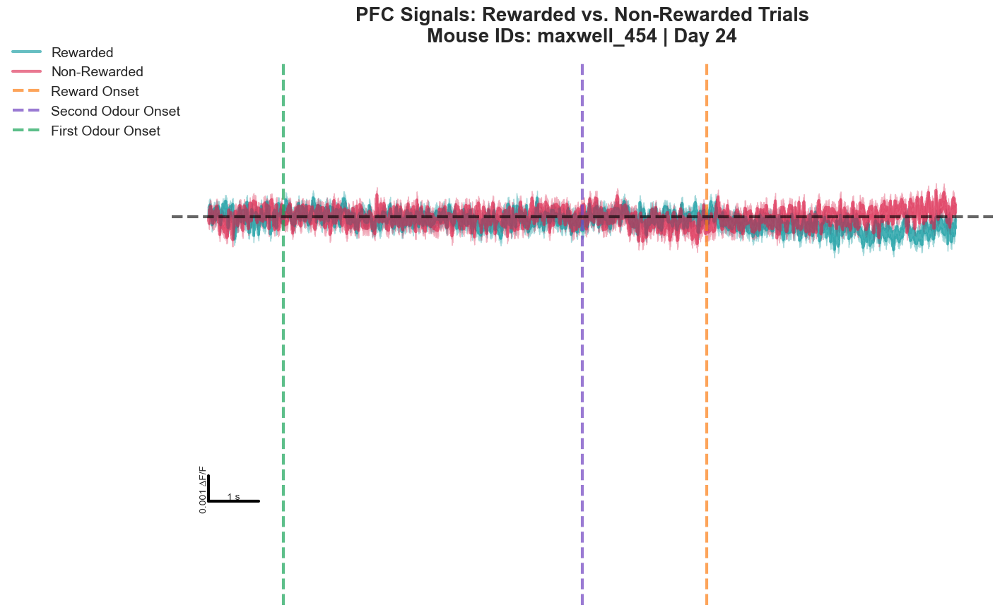

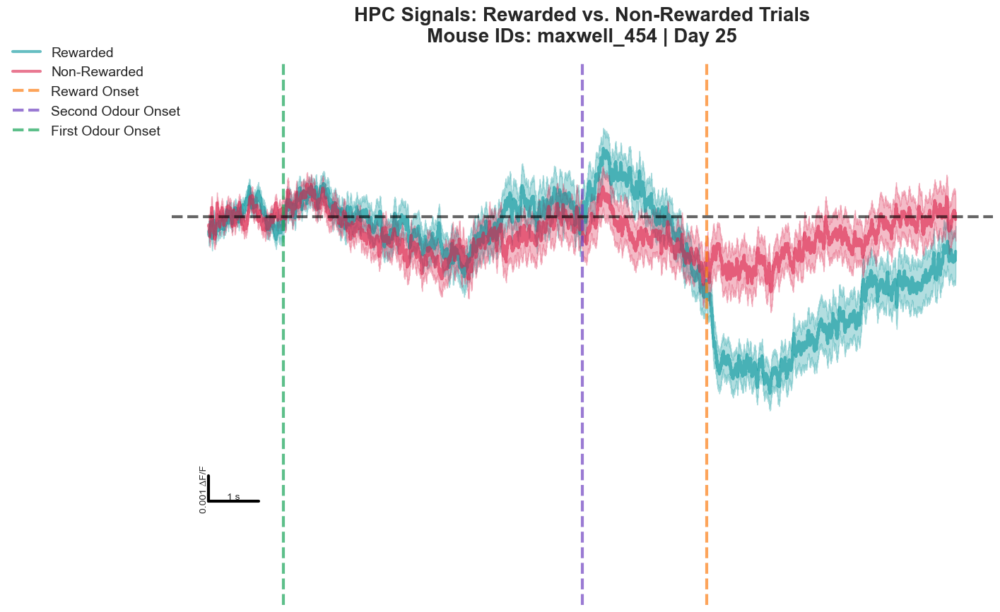

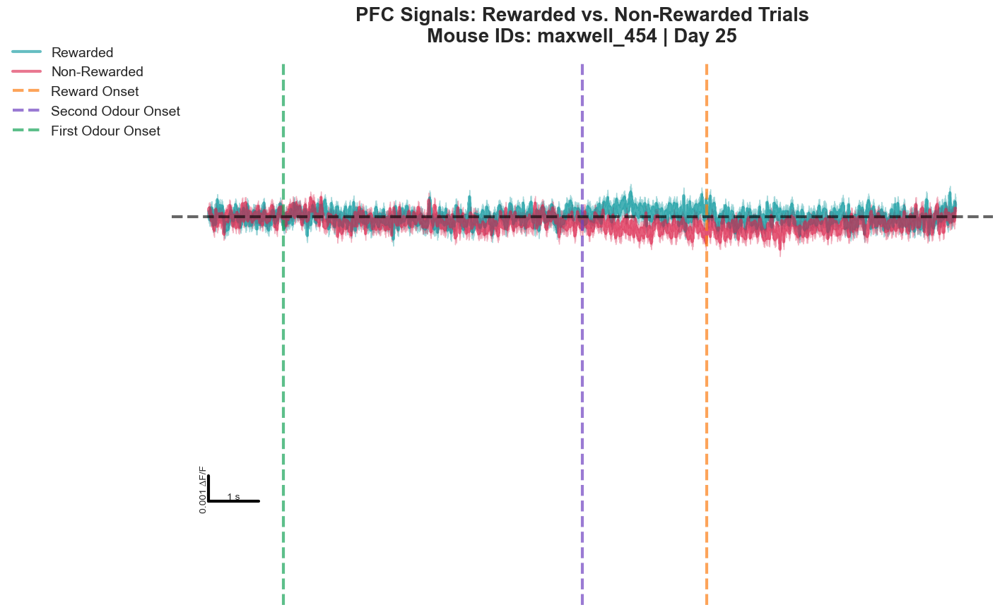

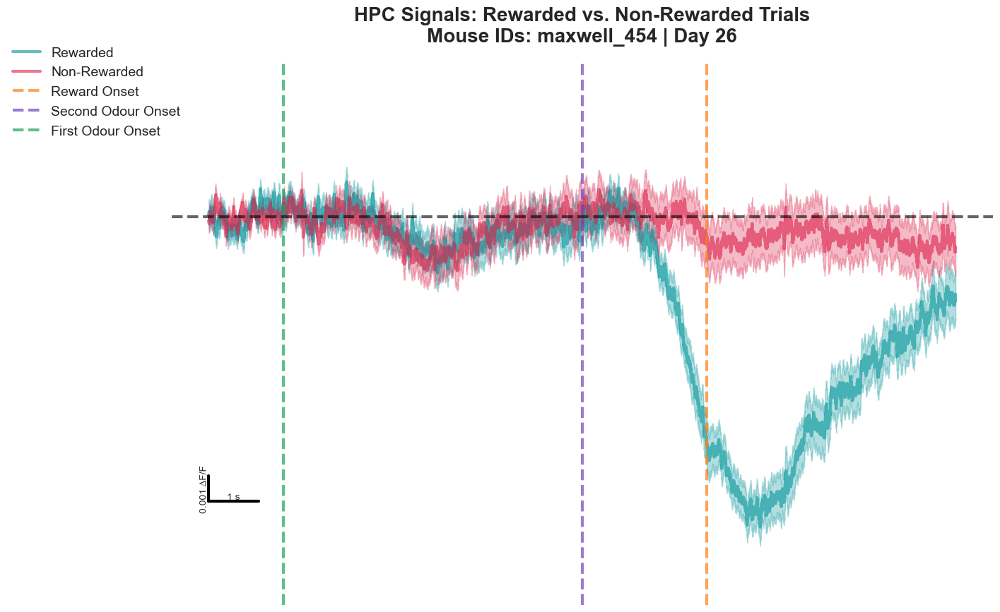

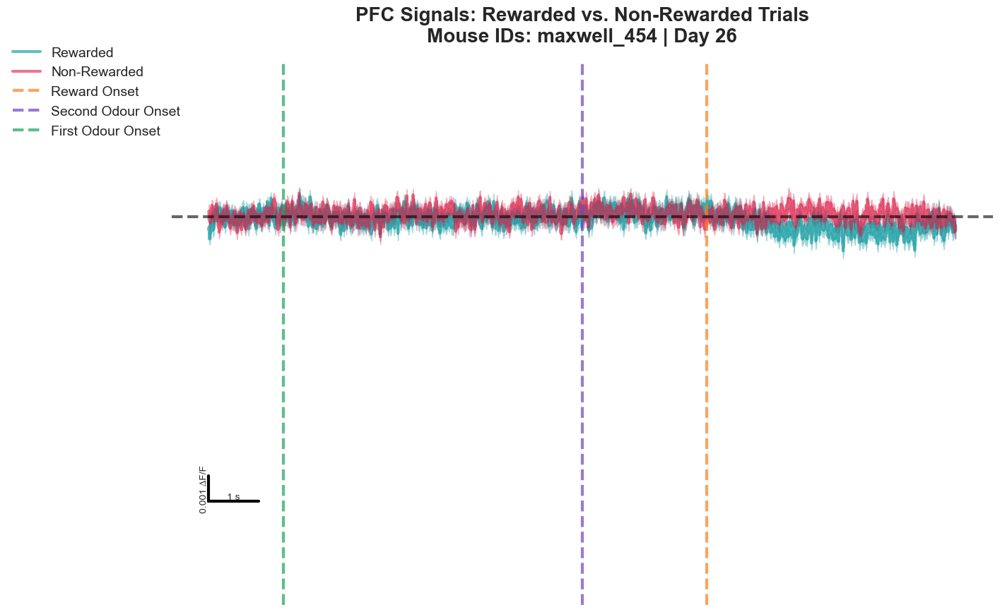

In [13]:
mouse_ids = ['maxwell_454']
# 14: 51%, 17: 56.9%, 18: 78.3% ,19:90.97%
days_of_interest = [17,18,19,20,21,22,23,24,25,26]

for day in days_of_interest:
    plot_rewarded_and_nonrewarded_signals(mouse_ids, day)

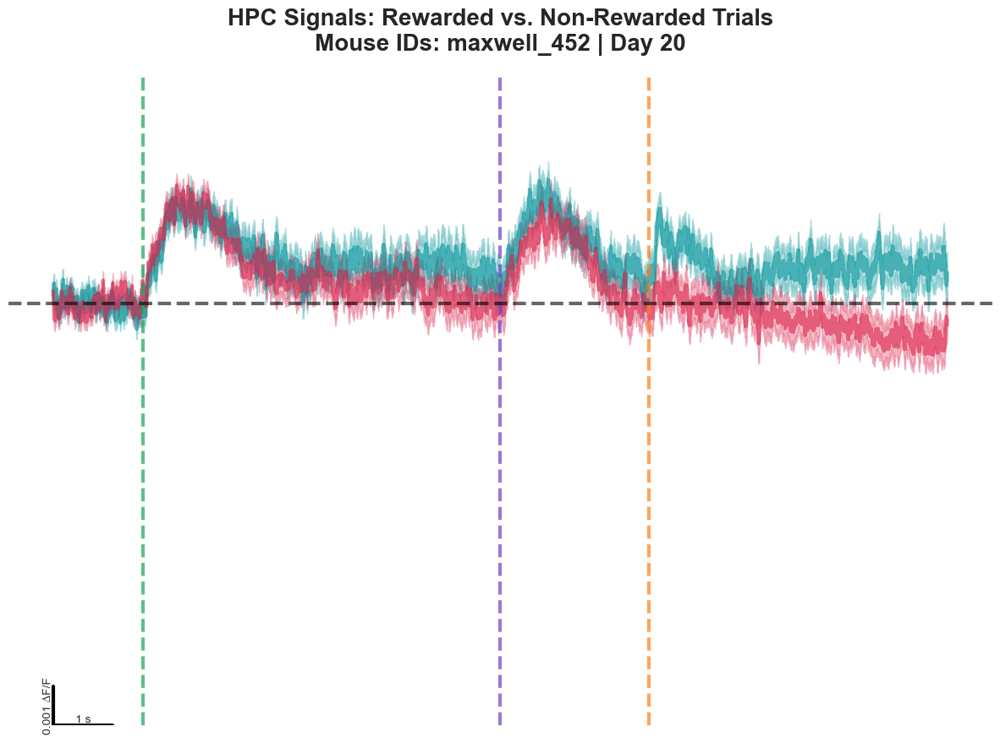

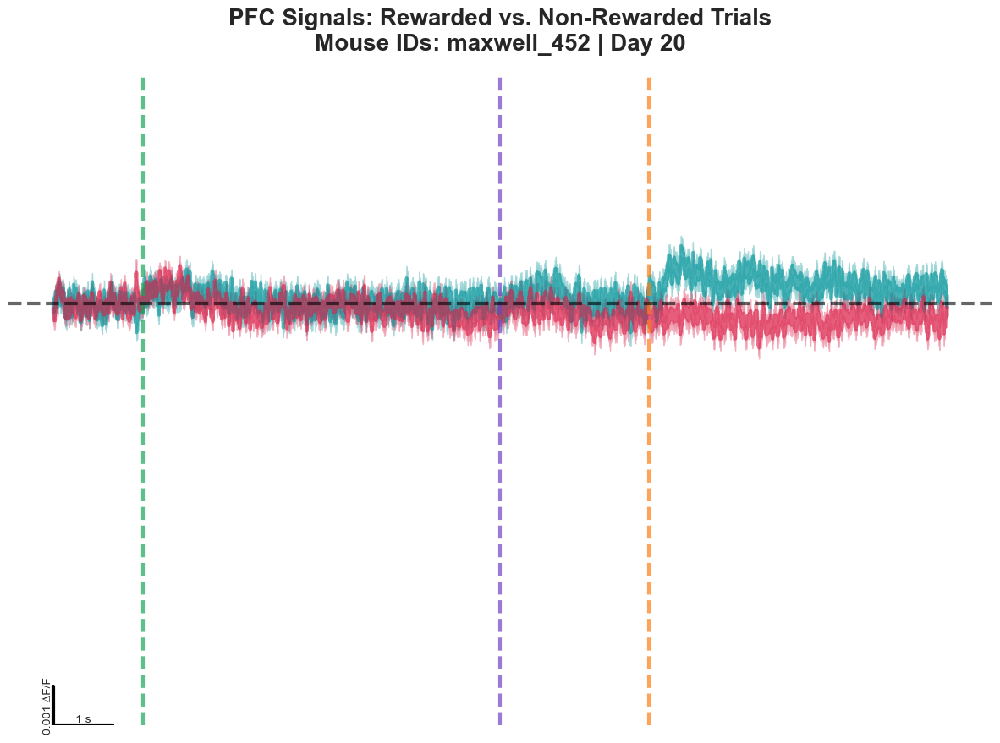

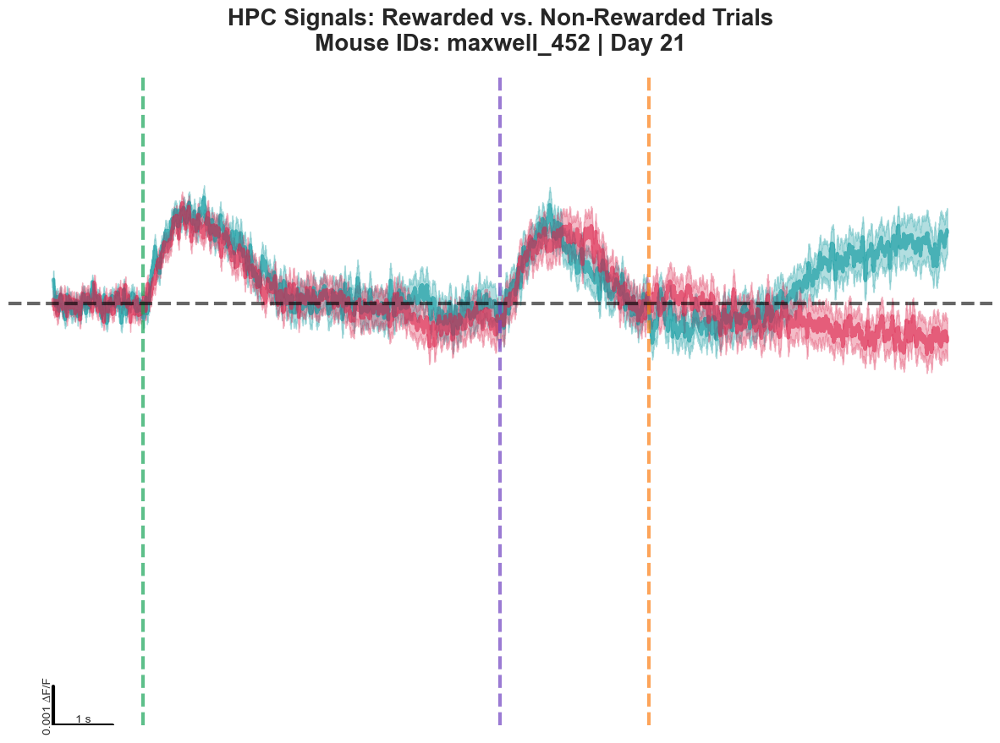

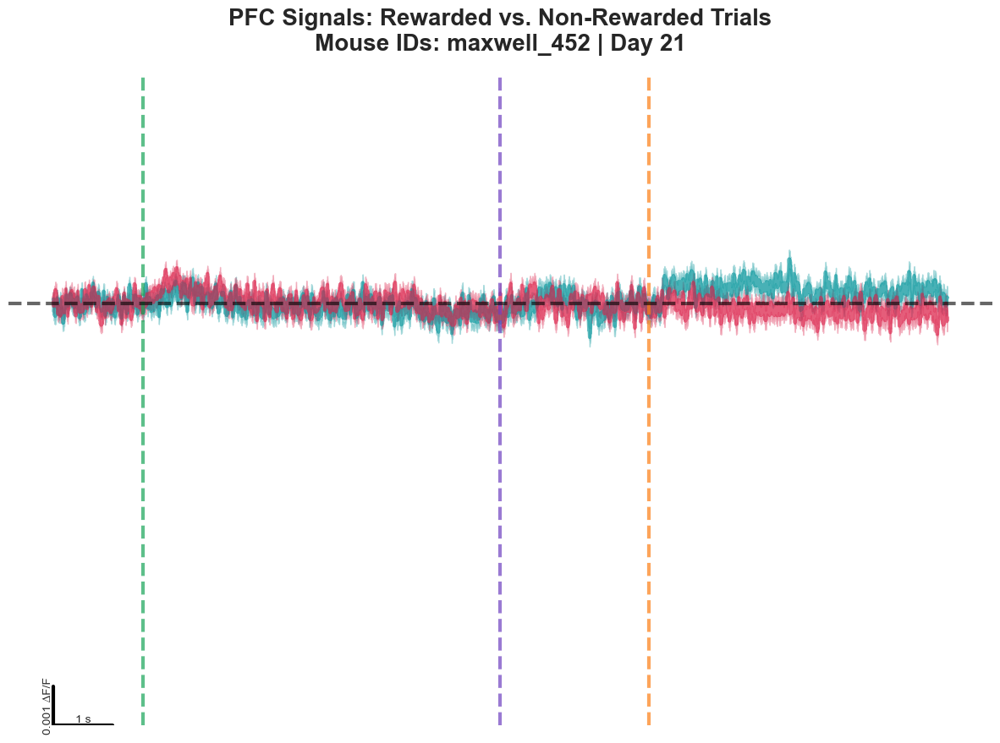

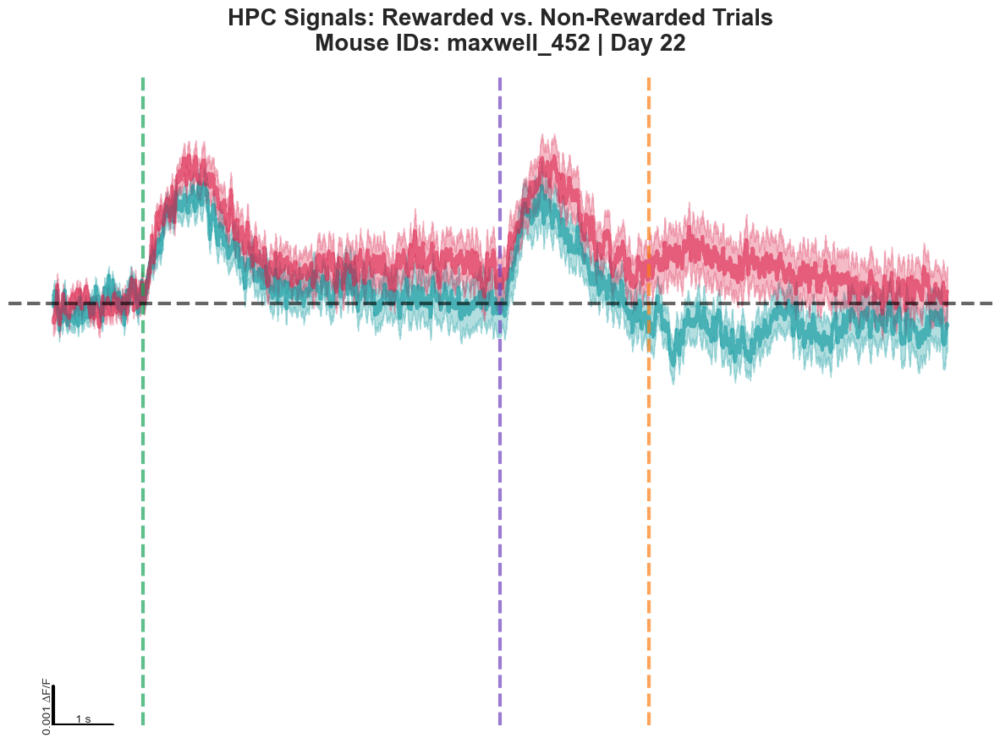

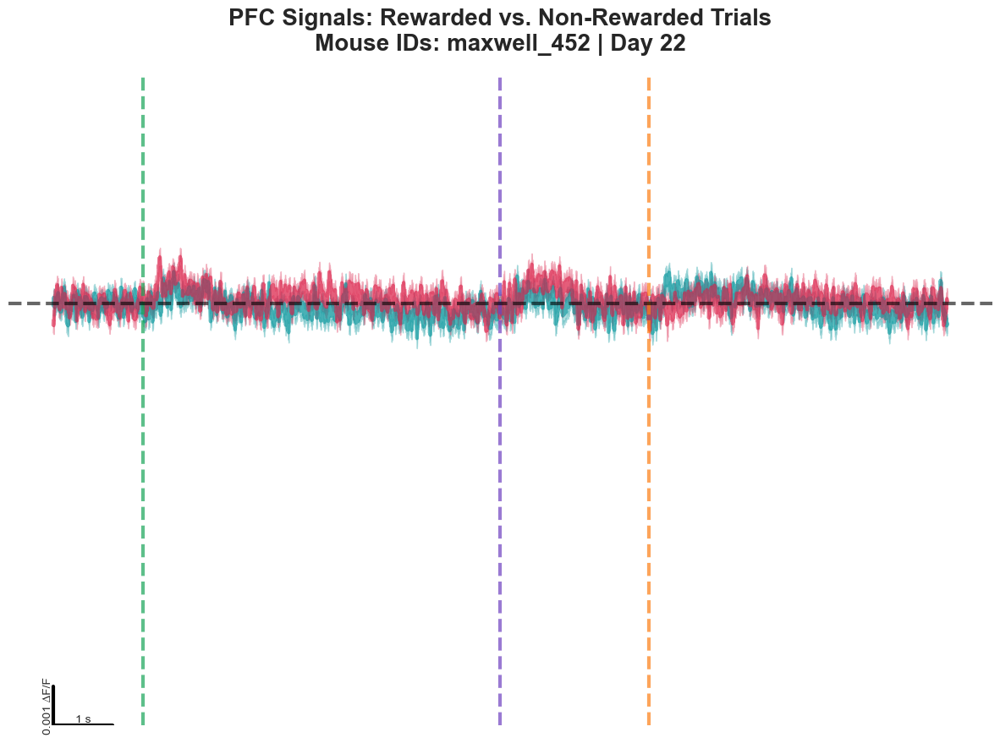

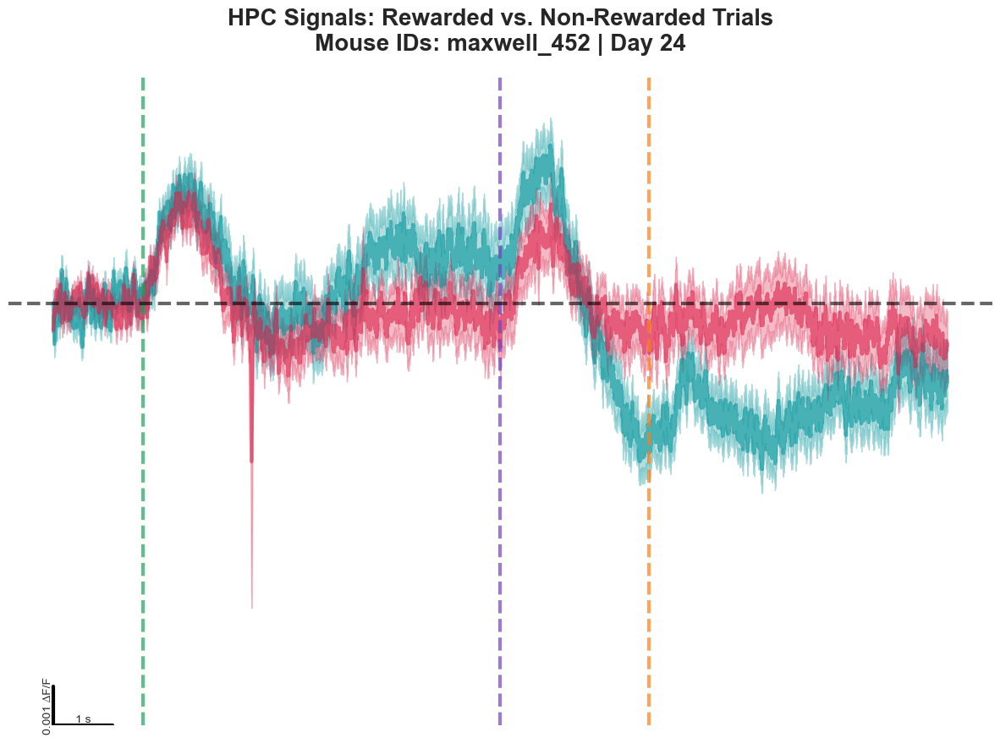

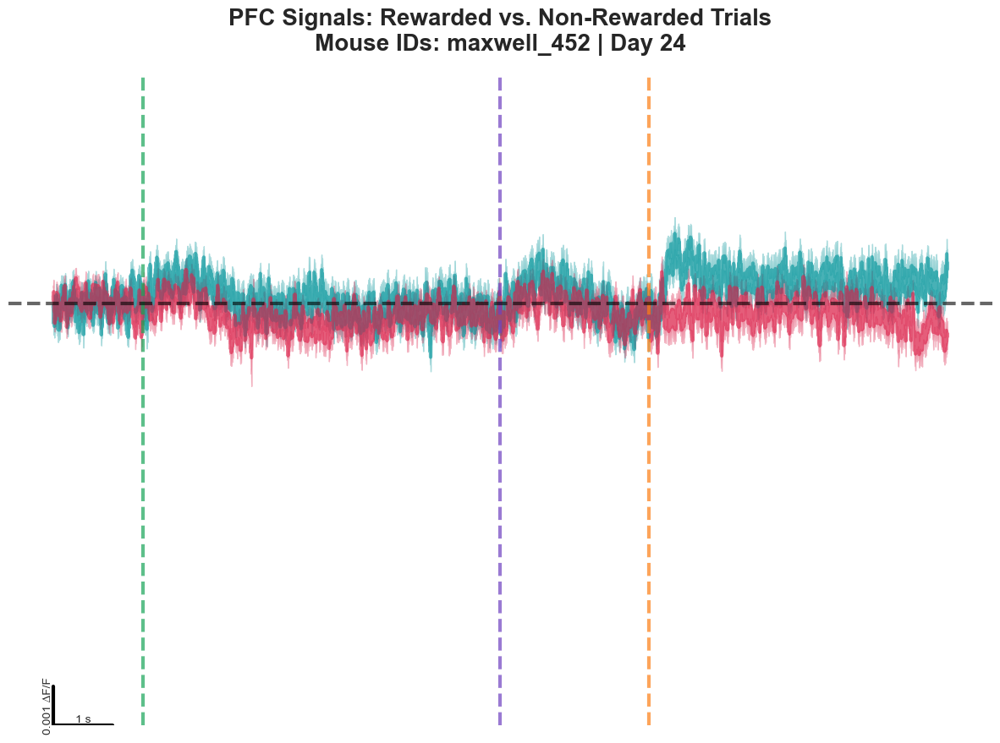

In [236]:
mouse_ids = ['maxwell_452']
#20: 66%, 21:71% 22:76% 24: 87%
days_of_interest = [20,21,22,24]

for day in days_of_interest:
    plot_rewarded_and_nonrewarded_signals(mouse_ids, day)

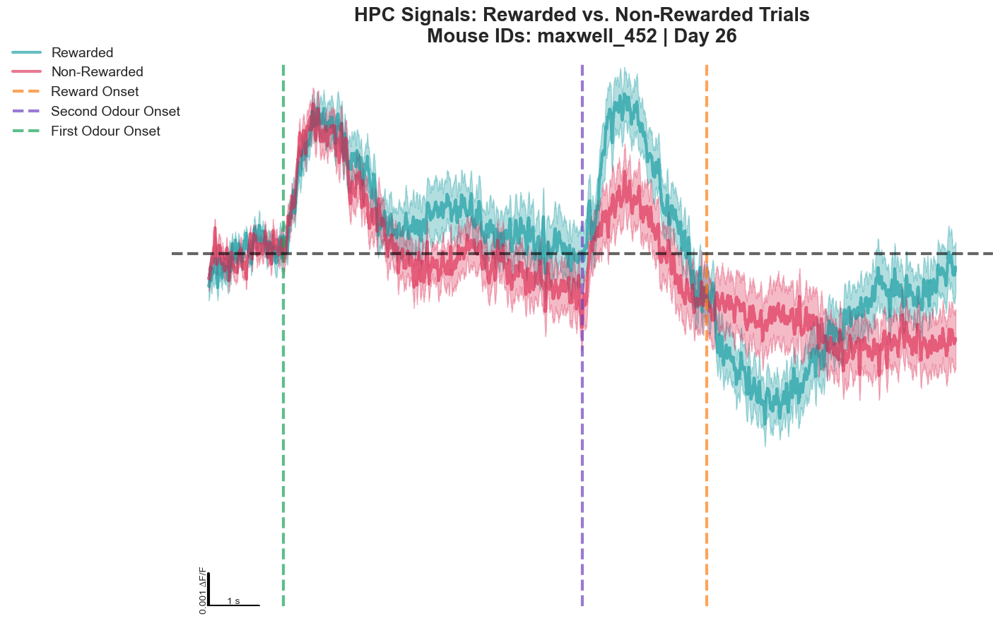

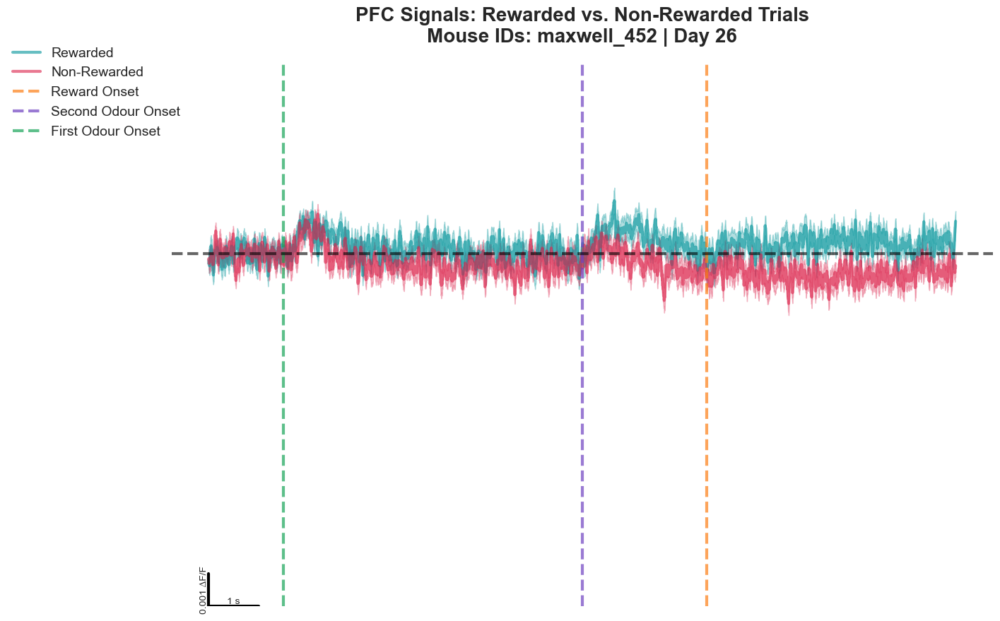

In [8]:
mouse_ids = ['maxwell_452']
# 14: 51%, 17: 56.9%, 18: 78.3% ,19:90.97%
days_of_interest = [26]

for day in days_of_interest:
    plot_rewarded_and_nonrewarded_signals(mouse_ids, day)

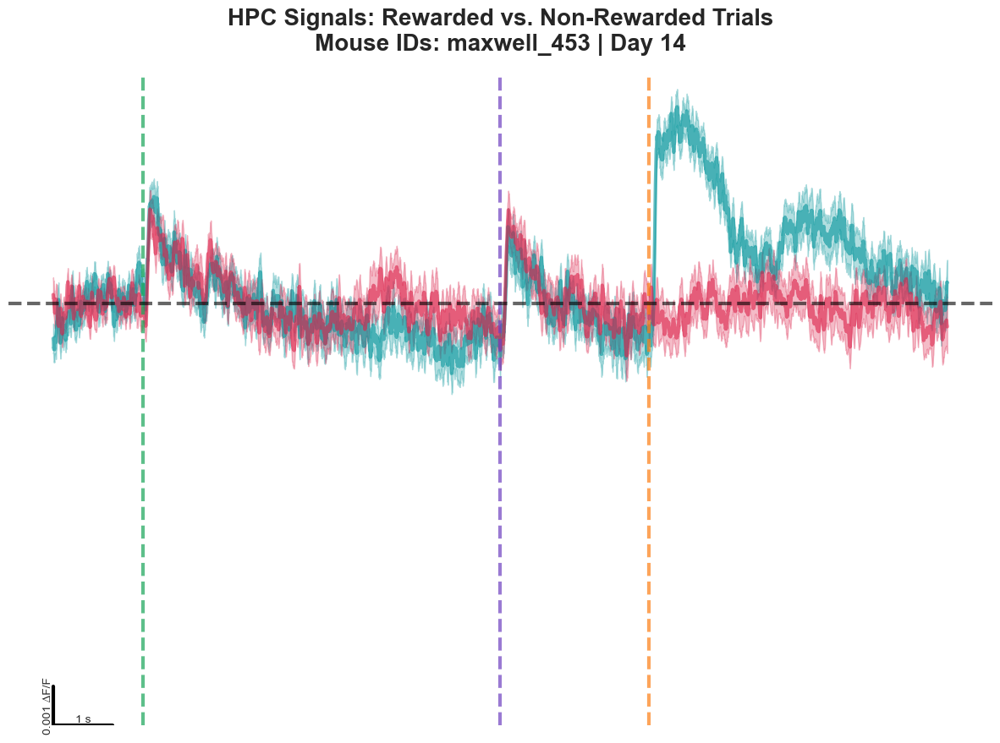

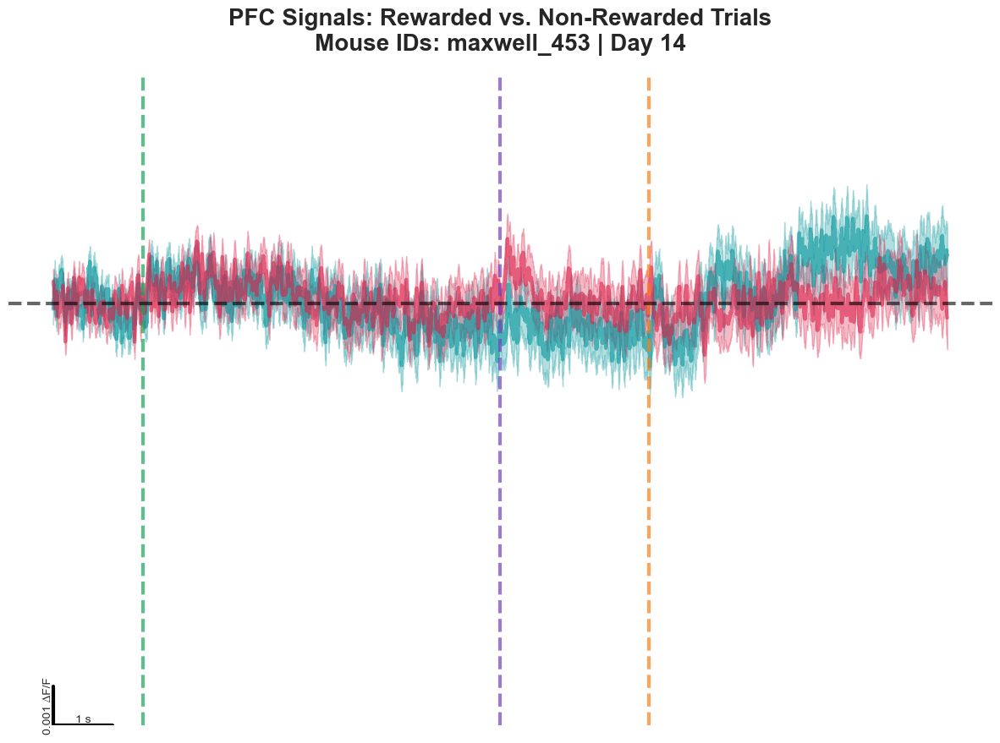

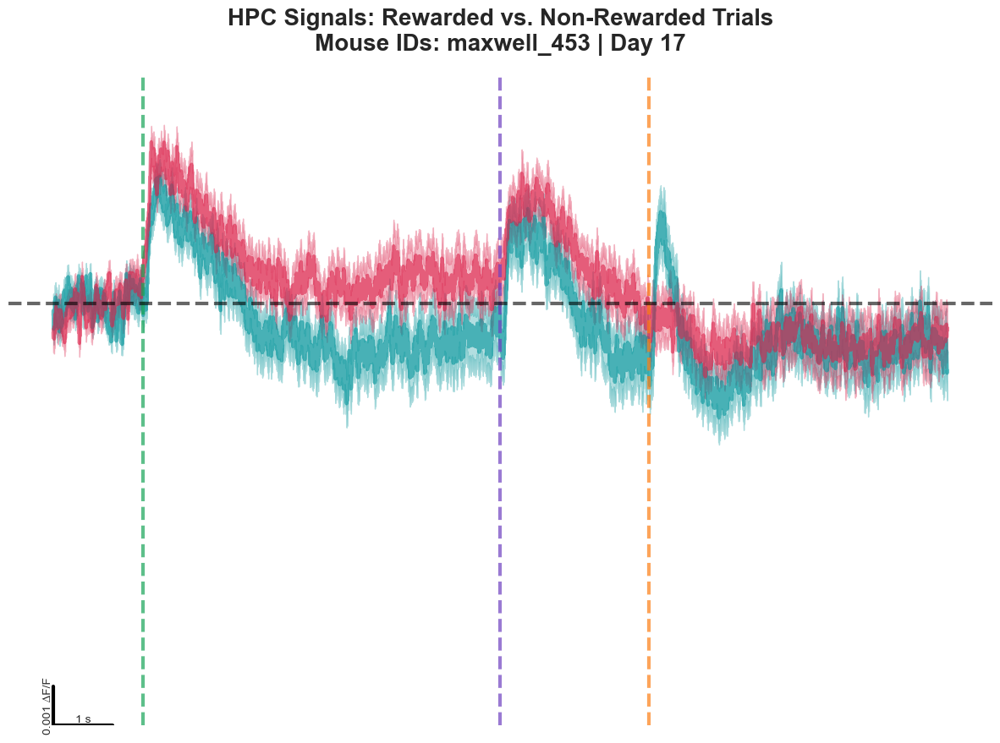

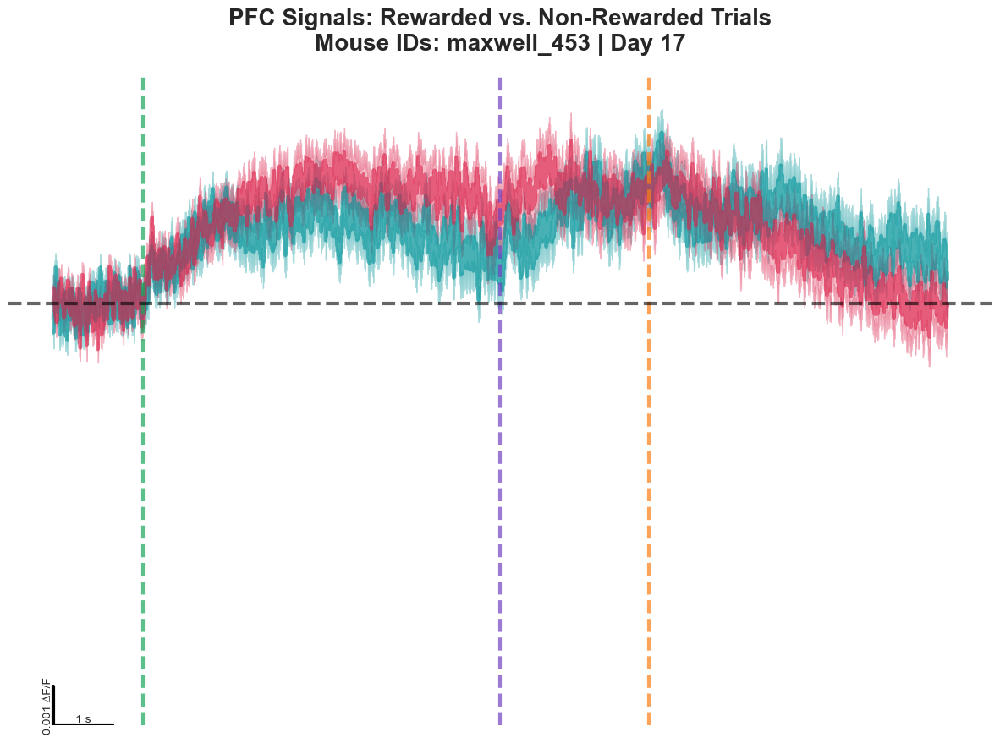

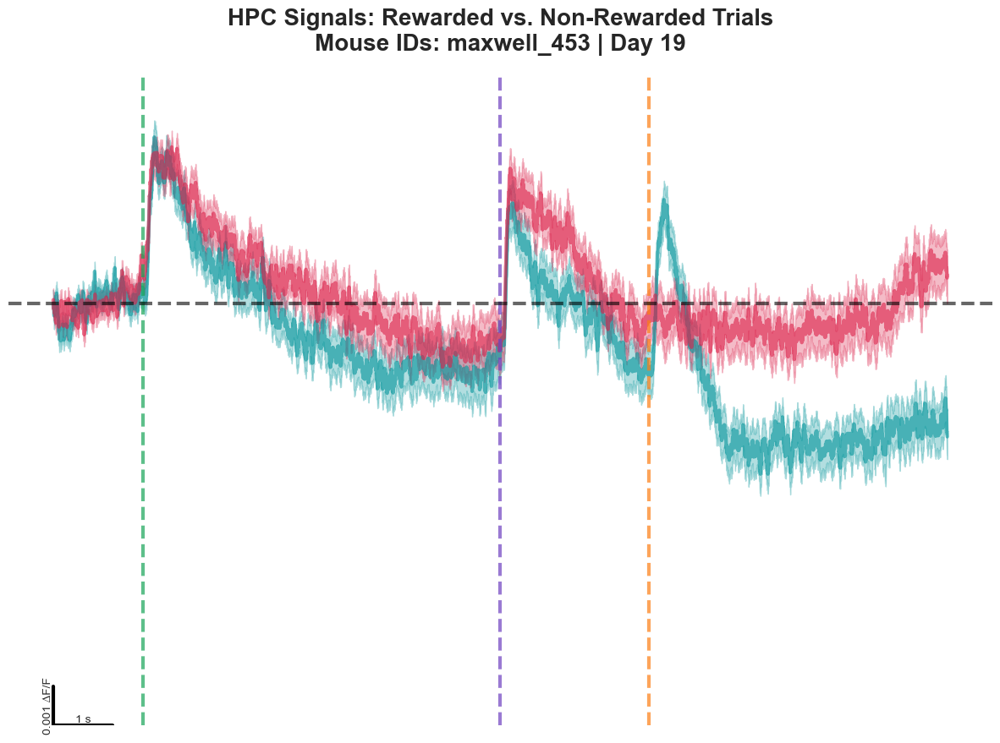

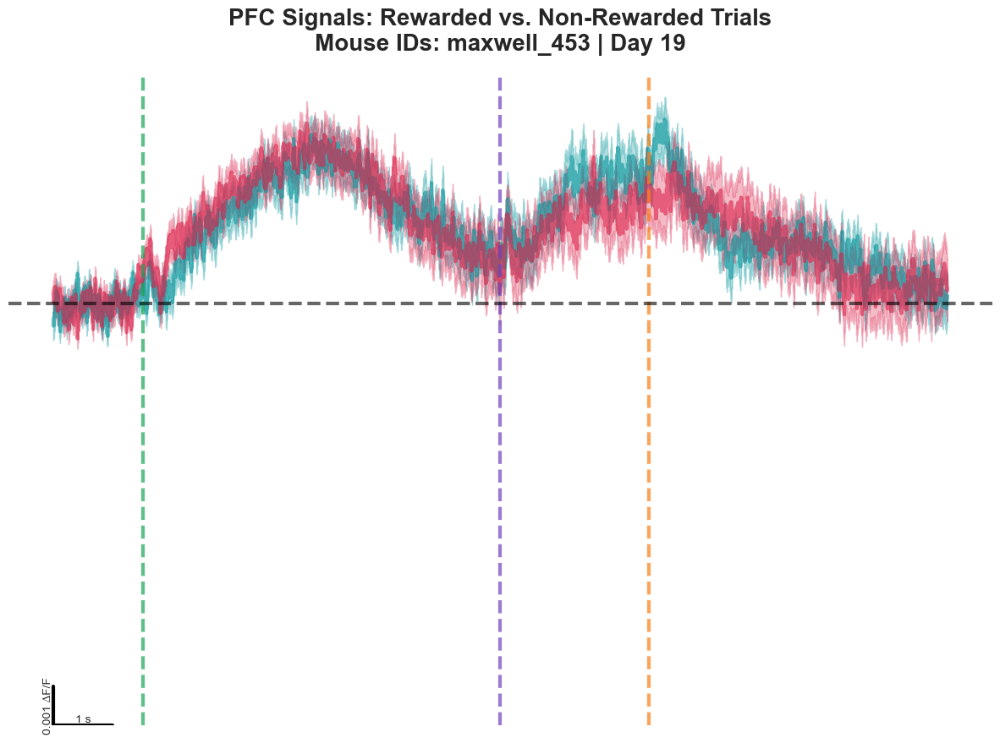

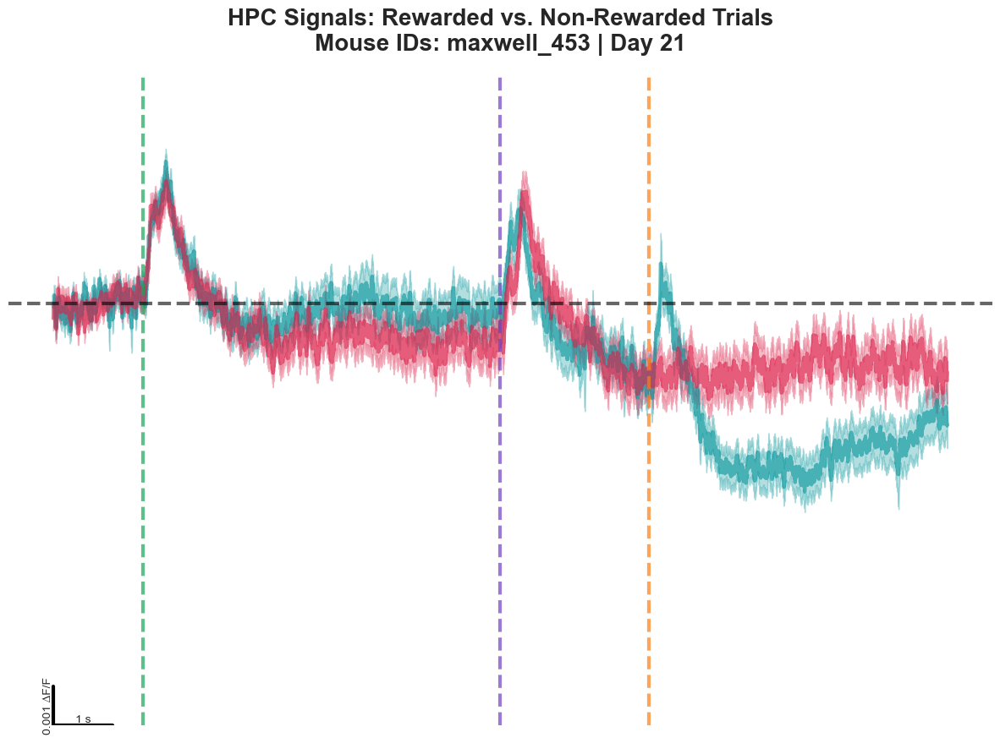

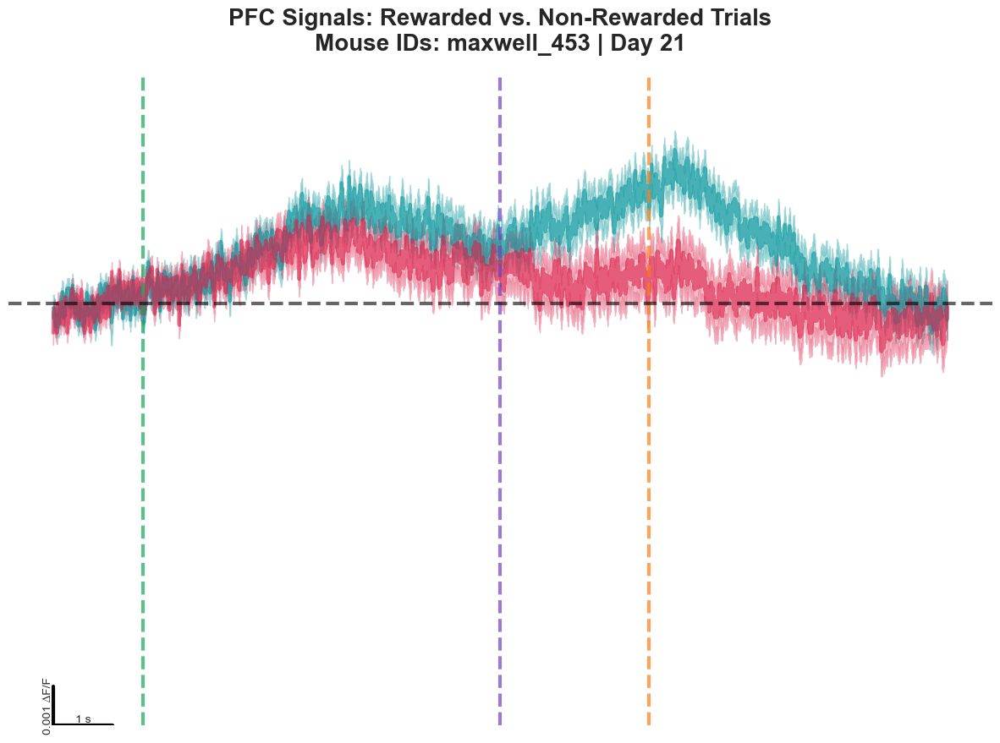

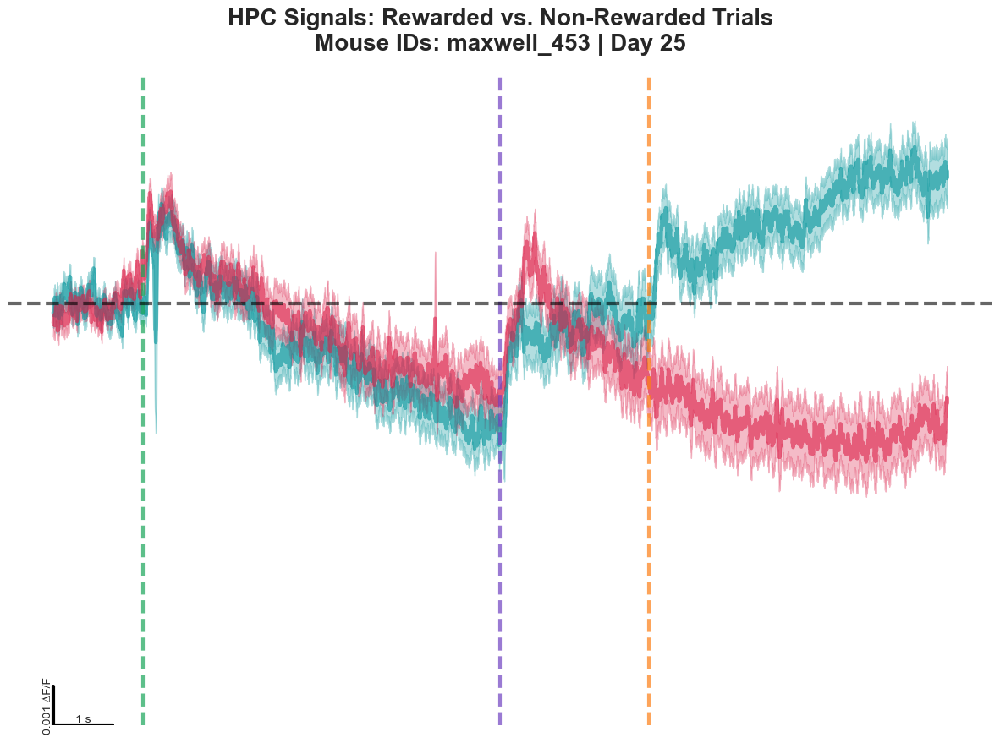

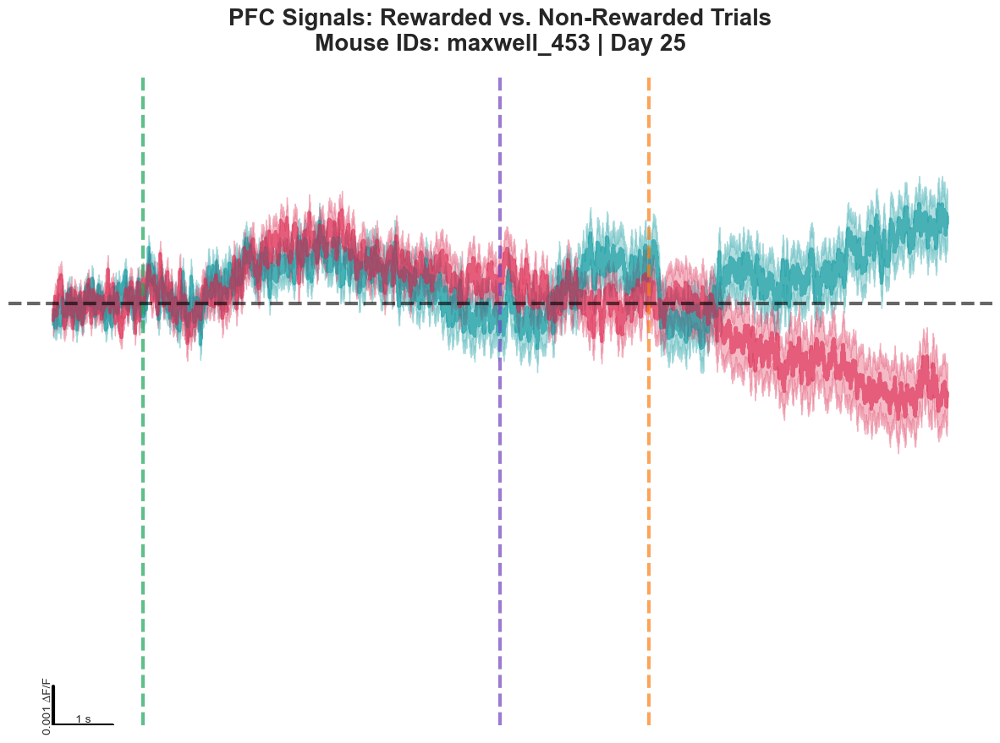

In [225]:
mouse_ids = ['maxwell_453']
# 14: 40% correct, 16 52%, 17:64%, 19: 77% correct, 23: 95.8% correct,
days_of_interest = [14,17,19,21,25]

for day in days_of_interest:
    plot_rewarded_and_nonrewarded_signals(mouse_ids, day)

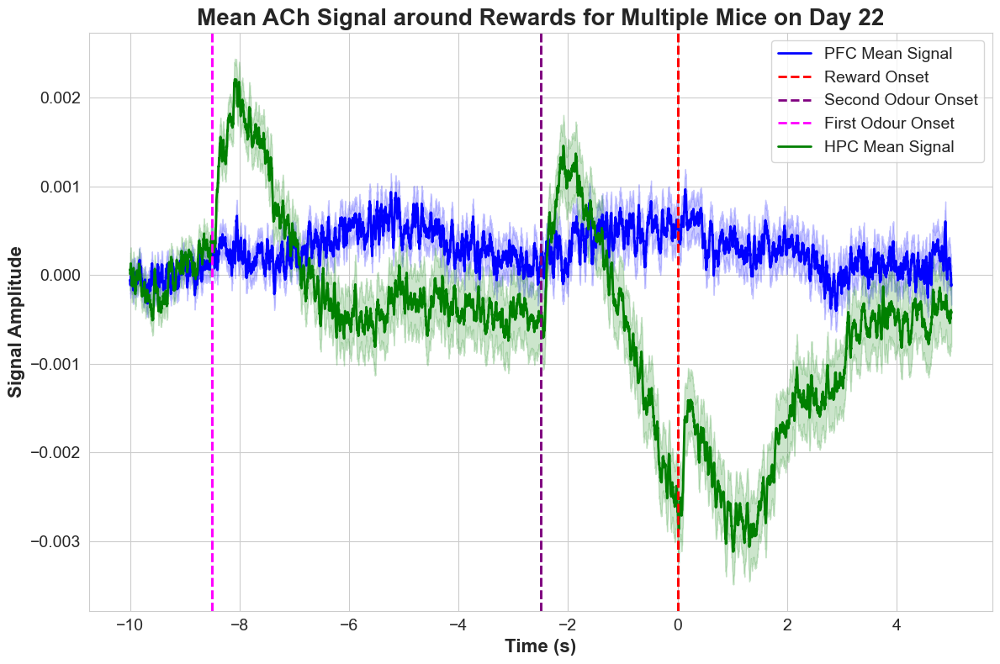

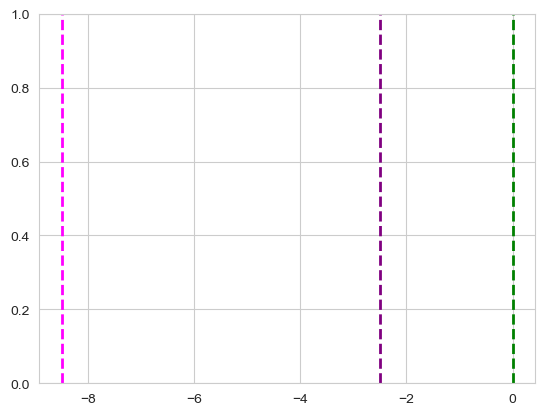

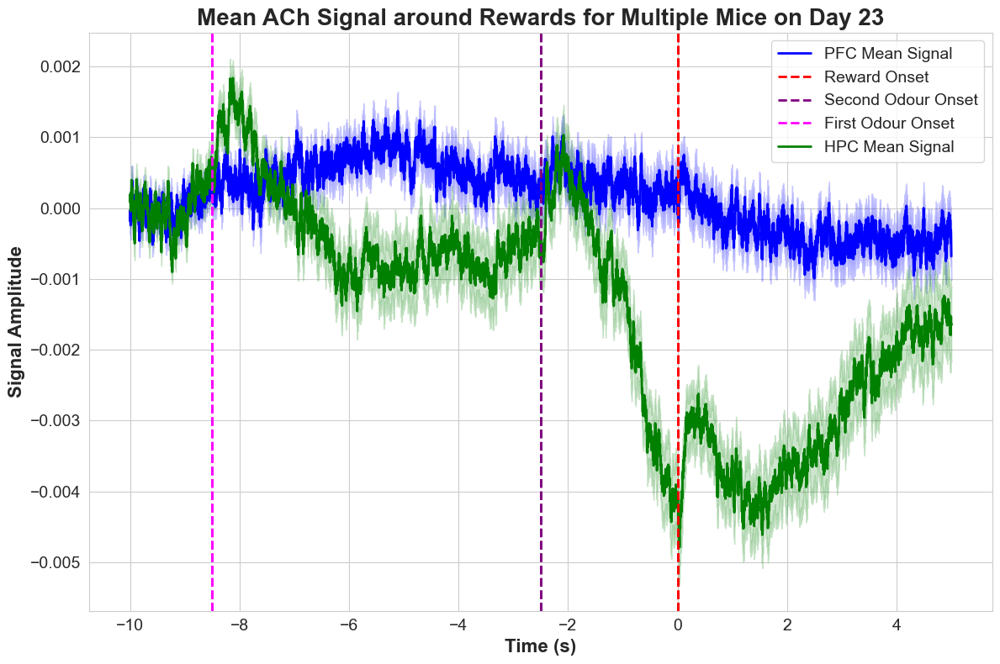

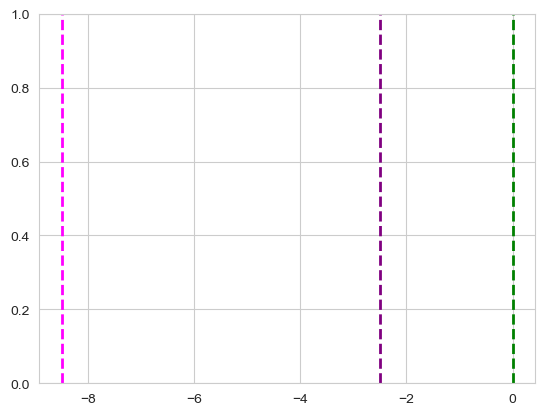

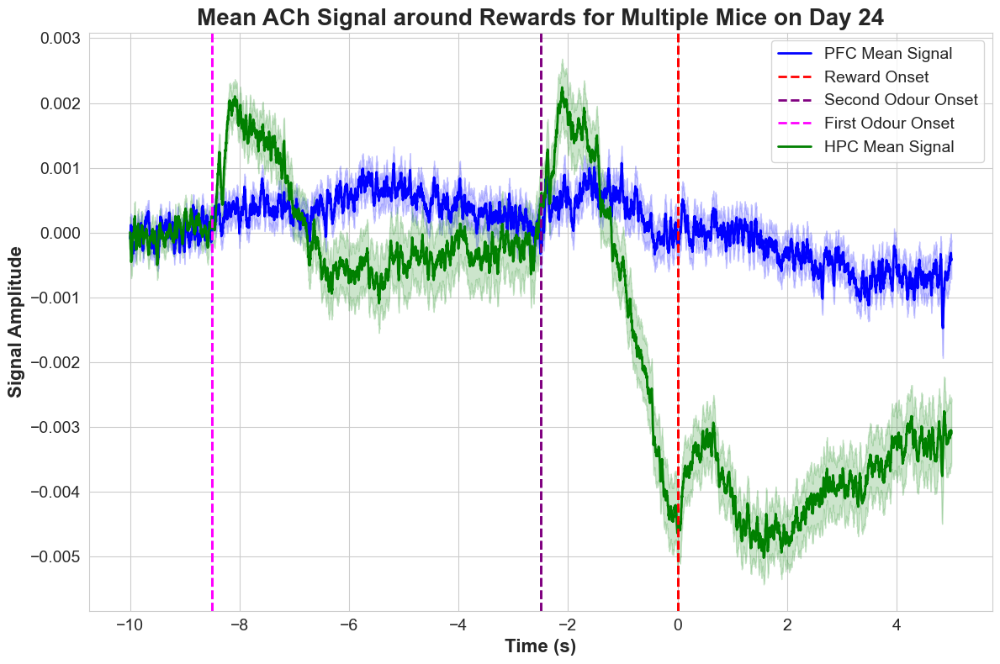

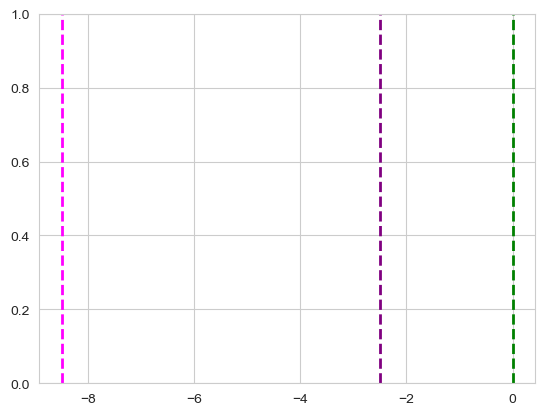

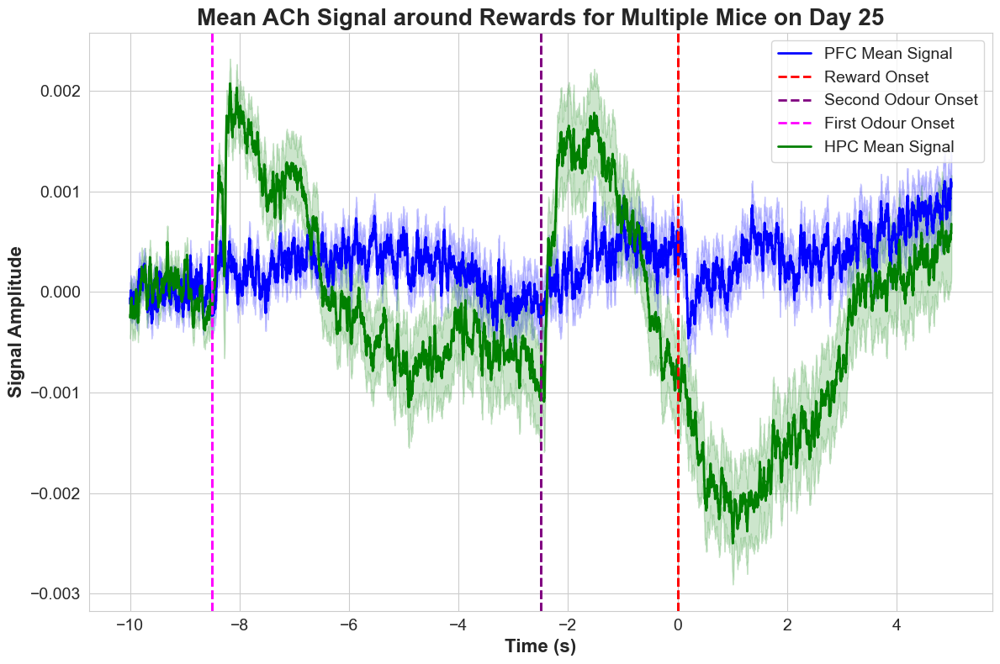

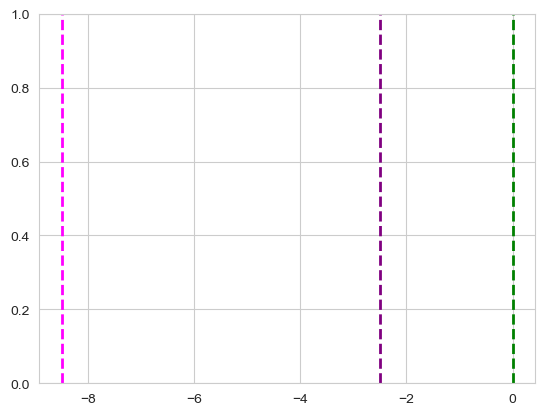

In [238]:
mouse_ids = ['maxwell_452','maxwell_453','maxwell_454']
#23: 95.8% correct, 19: 77% correct, 14: 40% correct
days_of_interest = [22,23,24,25]
for day in days_of_interest:
    compare_signals_across_mice(mouse_ids, day, overlay=True, reward_signal=True)

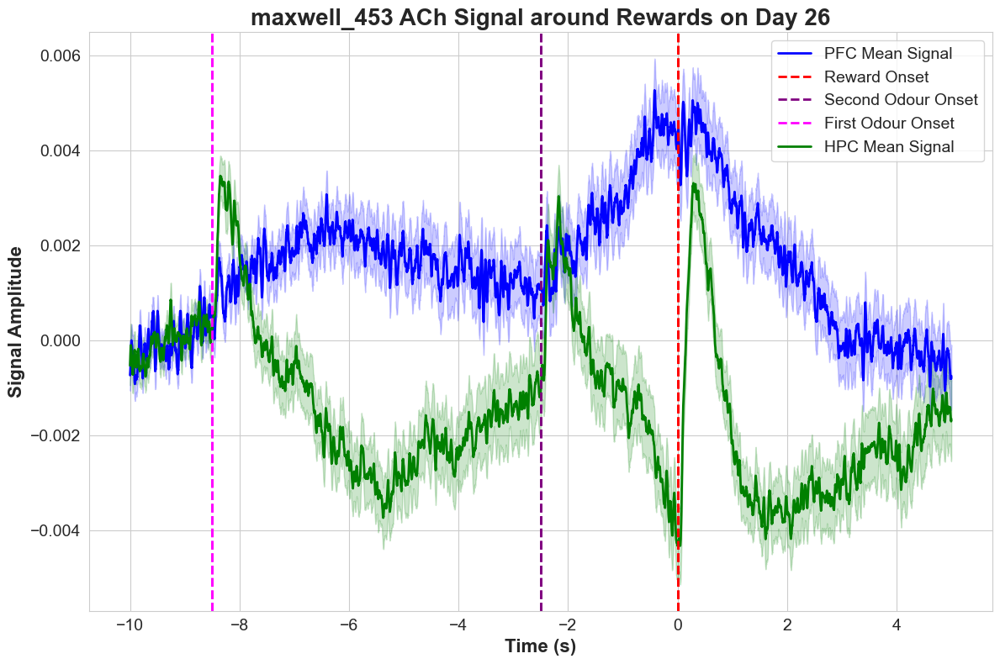

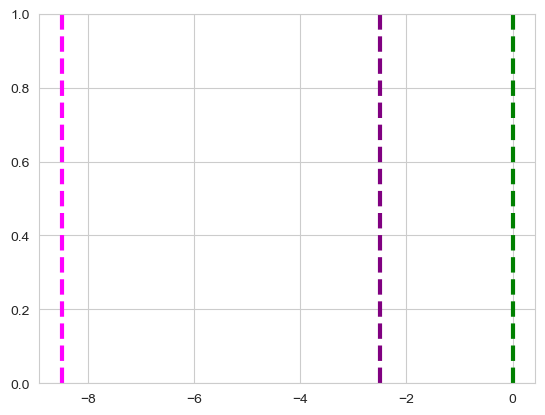

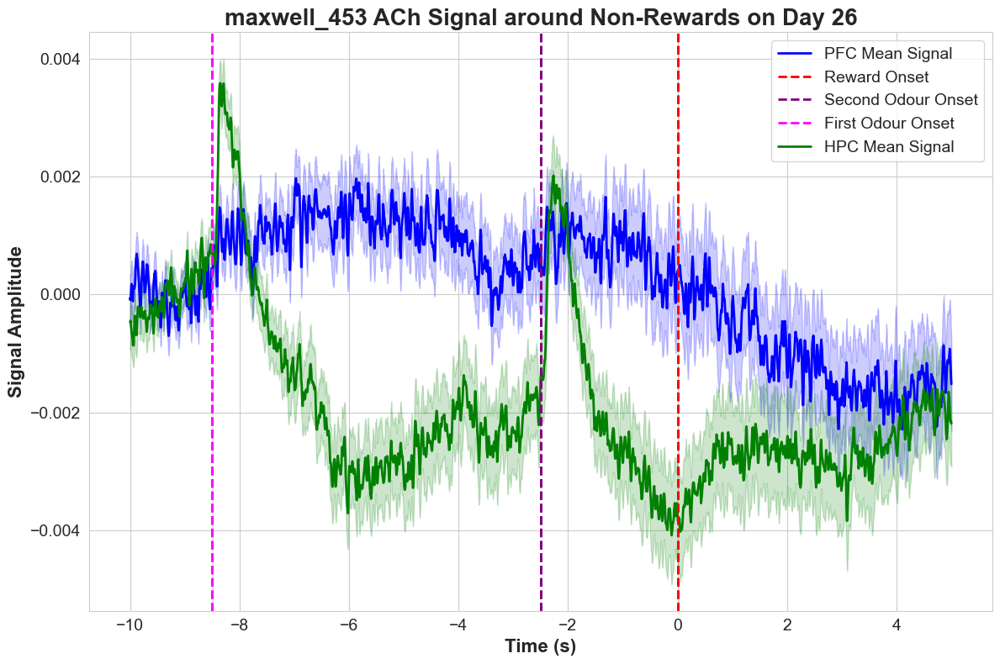

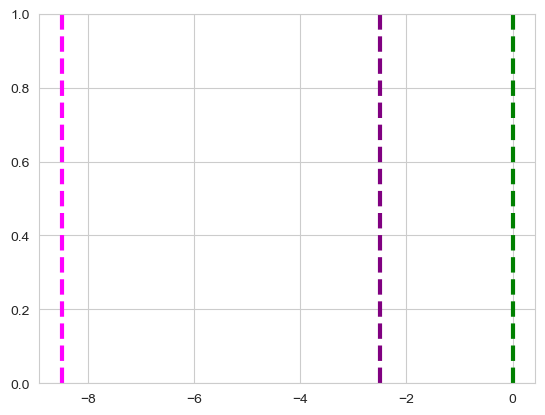

In [6]:
mouse_ids = ['maxwell_453']
#23: 95.8% correct, 19: 77% correct, 14: 40% correct
days_of_interest = [26]
for day in days_of_interest:
    compare_signals_across_mice(mouse_ids, day, overlay=True, reward_signal=True)

for day in days_of_interest:
    compare_signals_across_mice(mouse_ids, day, overlay=True, reward_signal=False)

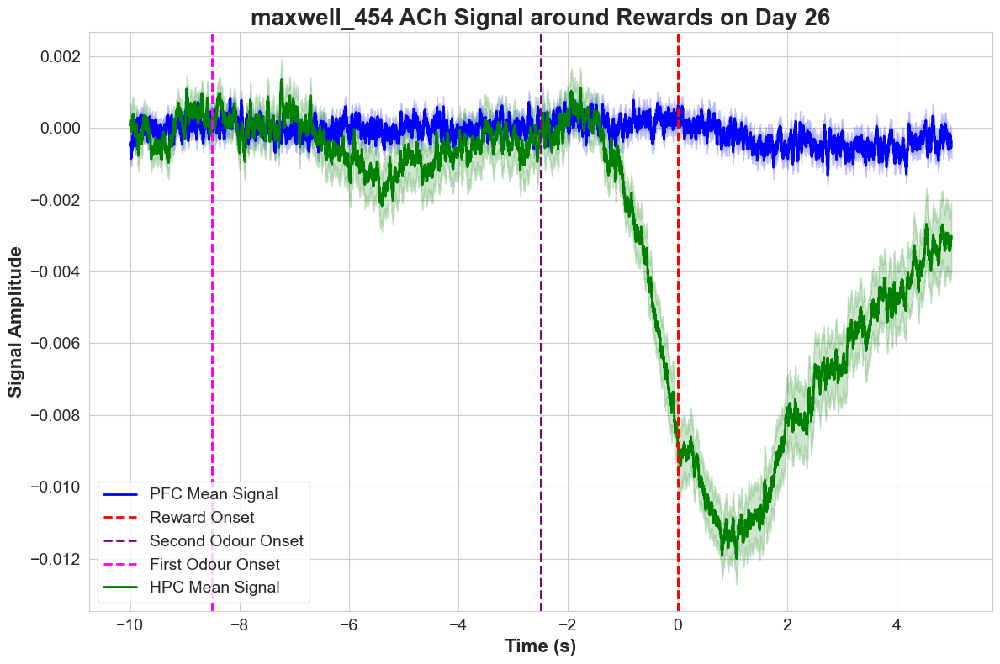

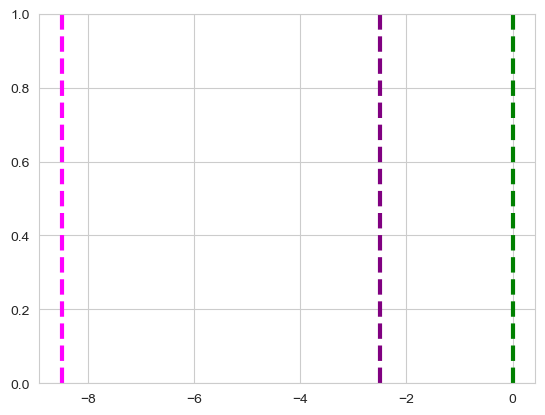

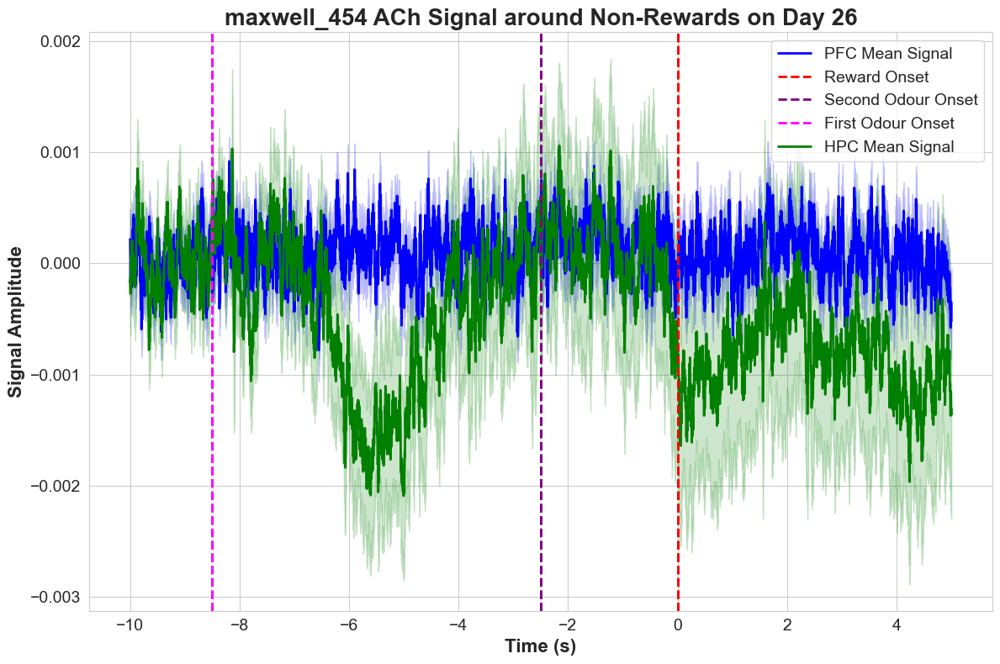

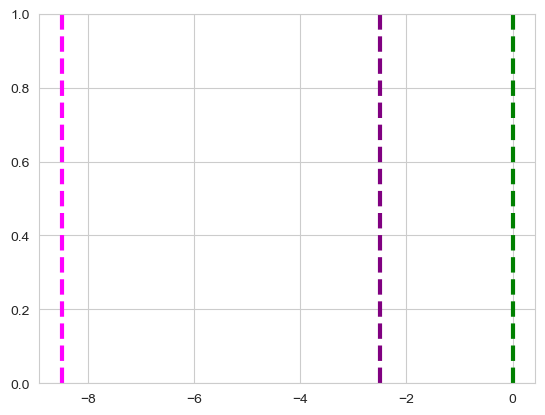

In [14]:
mouse_ids = ['maxwell_454']
#23: 95.8% correct, 19: 77% correct, 14: 40% correct
days_of_interest = [26]
for day in days_of_interest:
    compare_signals_across_mice(mouse_ids, day, overlay=True, reward_signal=True)

for day in days_of_interest:
    compare_signals_across_mice(mouse_ids, day, overlay=True, reward_signal=False)

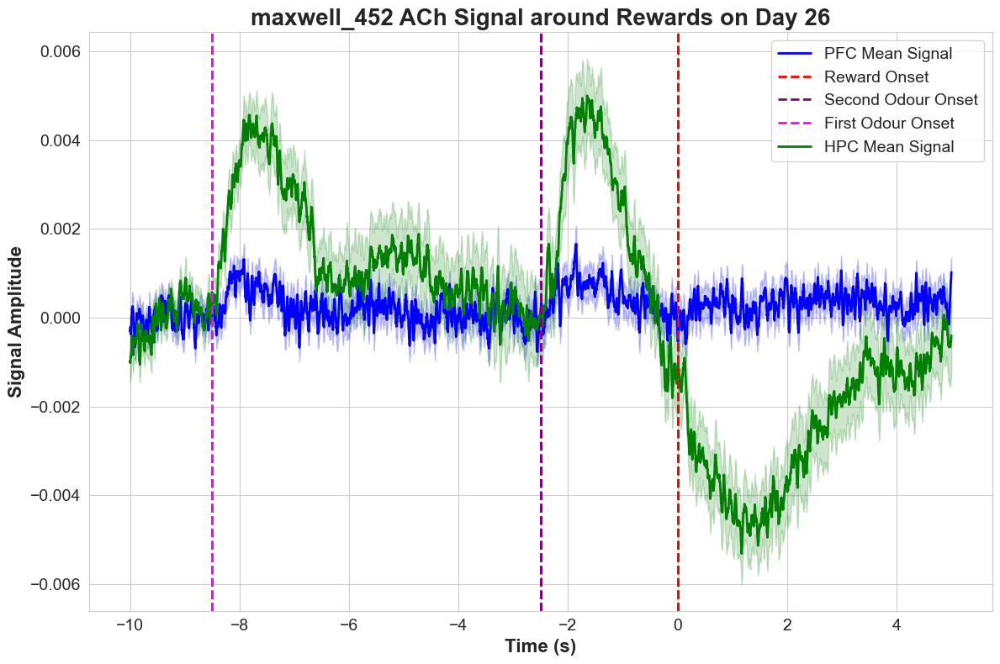

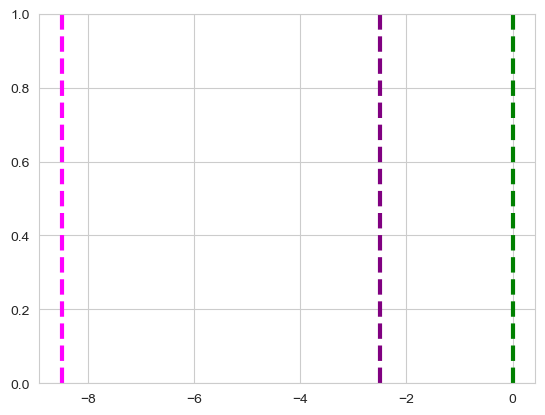

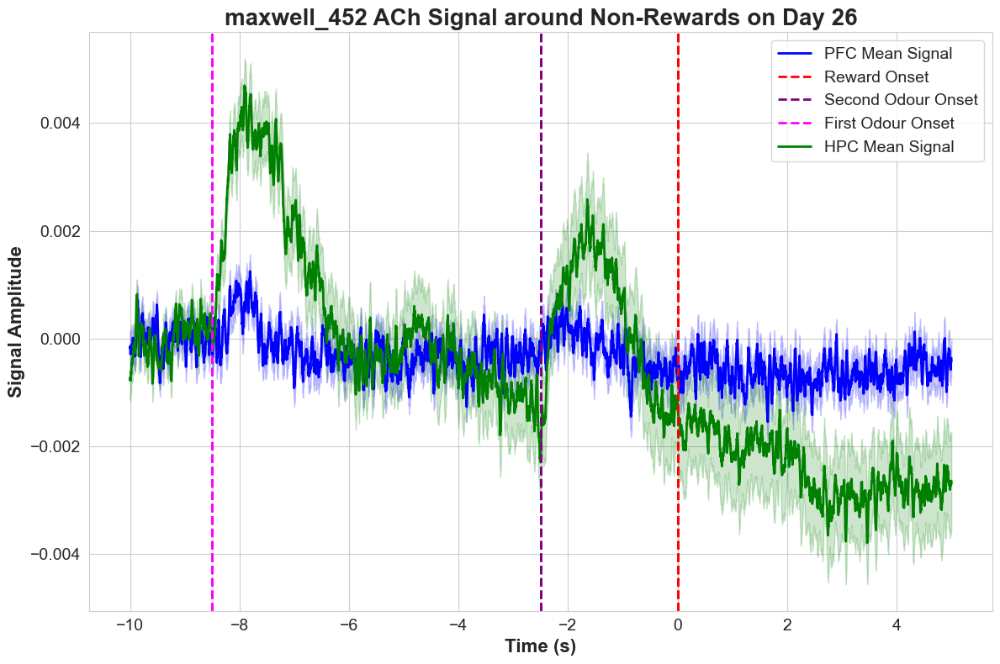

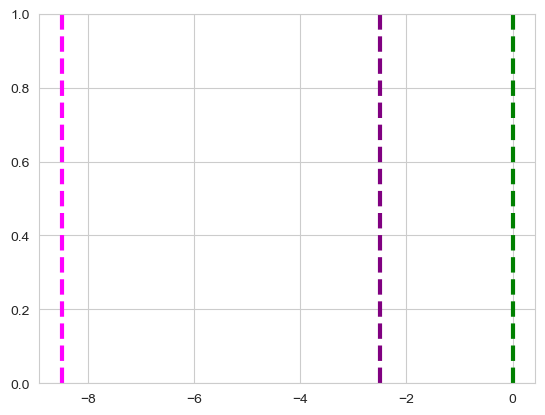

In [15]:
mouse_ids = ['maxwell_452']
#23: 95.8% correct, 19: 77% correct, 14: 40% correct
days_of_interest = [26]
for day in days_of_interest:
    compare_signals_across_mice(mouse_ids, day, overlay=True, reward_signal=True)

for day in days_of_interest:
    compare_signals_across_mice(mouse_ids, day, overlay=True, reward_signal=False)

/var/folders/xc/fqjpc3c109d8130c9p4w179nnjty6s/T/ipykernel_70397/1800309637.py:109: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', len(days_of_interest))


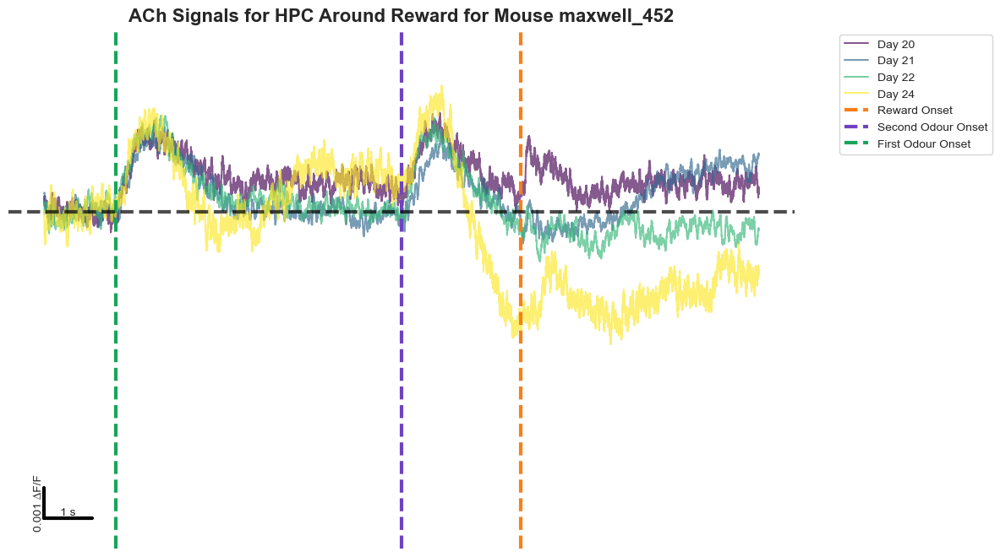

/var/folders/xc/fqjpc3c109d8130c9p4w179nnjty6s/T/ipykernel_70397/1800309637.py:109: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', len(days_of_interest))


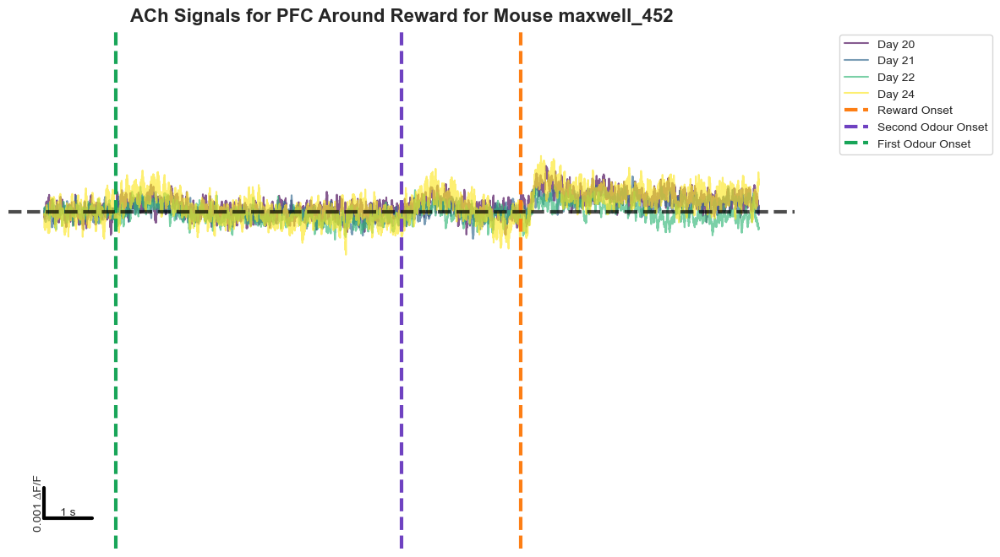

/var/folders/xc/fqjpc3c109d8130c9p4w179nnjty6s/T/ipykernel_70397/1800309637.py:109: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', len(days_of_interest))


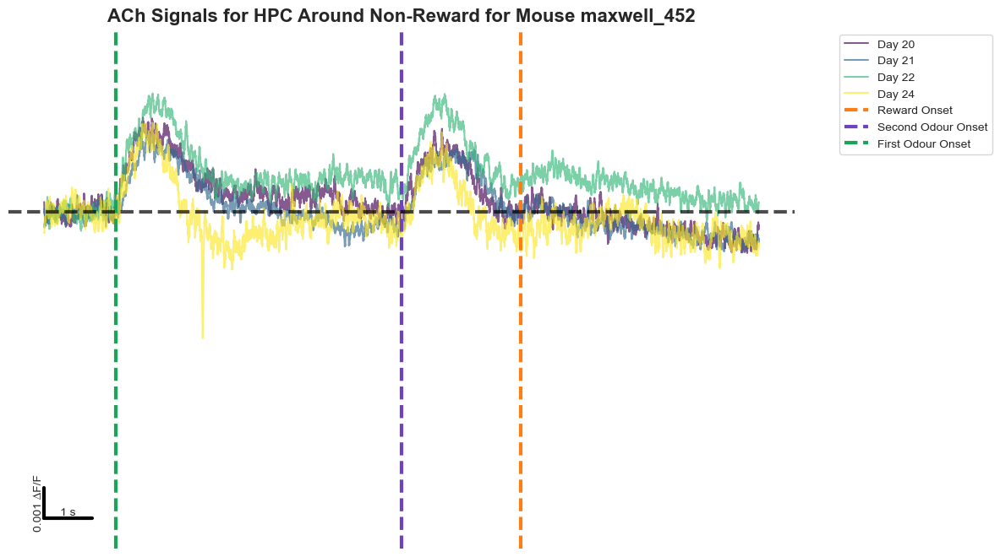

/var/folders/xc/fqjpc3c109d8130c9p4w179nnjty6s/T/ipykernel_70397/1800309637.py:109: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', len(days_of_interest))


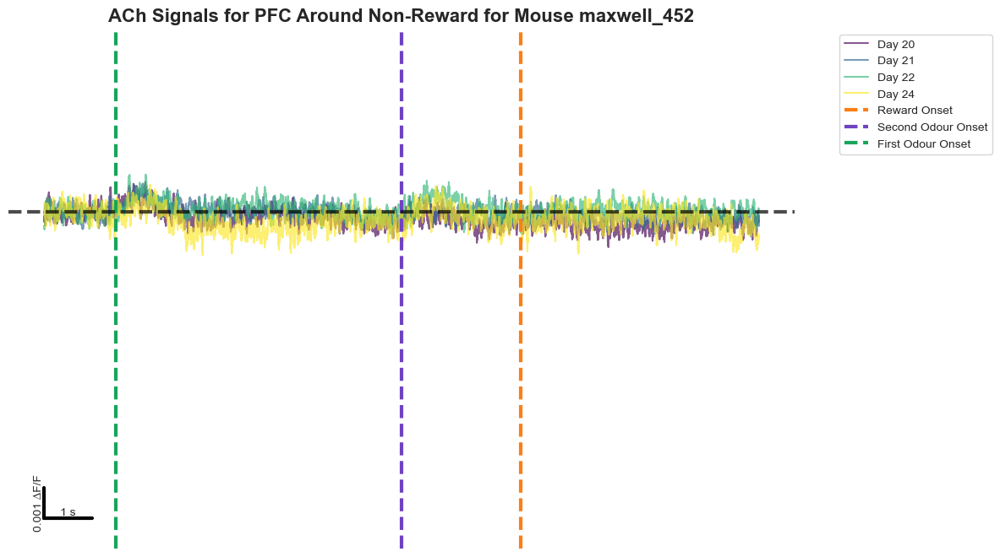

In [241]:
mouse_ids = ['maxwell_452']
#20: 66%, 21:71% 22:76% 24: 87%
days_of_interest = [20,21,22,24]
area_of_interest = 'HPC'
plot_average_signals_across_days(mouse_ids, days_of_interest, area_of_interest,reward_signal = True)
area_of_interest = 'PFC'
plot_average_signals_across_days(mouse_ids, days_of_interest, area_of_interest,reward_signal = True)

area_of_interest = 'HPC'
plot_average_signals_across_days(mouse_ids, days_of_interest, area_of_interest,reward_signal = False)
area_of_interest = 'PFC'
plot_average_signals_across_days(mouse_ids, days_of_interest, area_of_interest,reward_signal = False)

/var/folders/xc/fqjpc3c109d8130c9p4w179nnjty6s/T/ipykernel_70397/1800309637.py:109: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', len(days_of_interest))


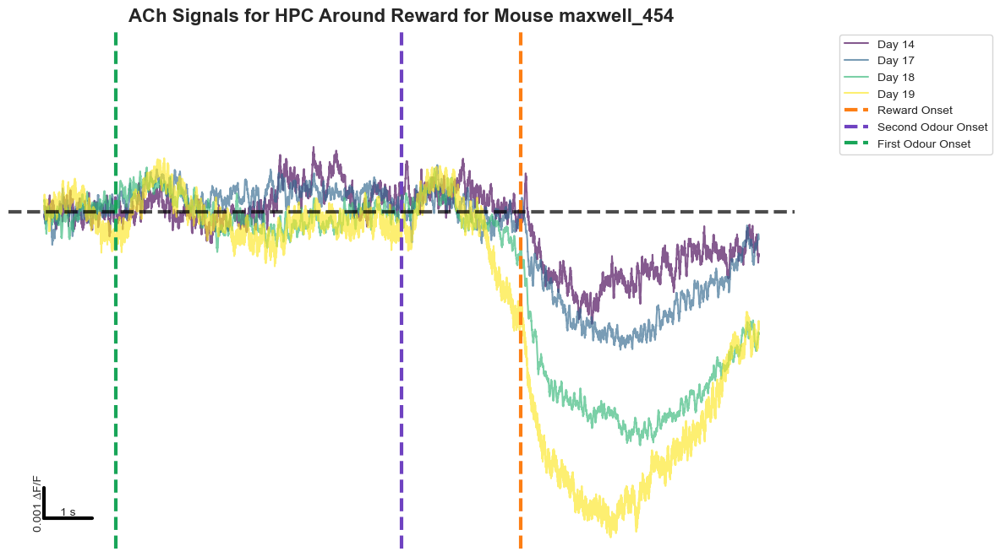

/var/folders/xc/fqjpc3c109d8130c9p4w179nnjty6s/T/ipykernel_70397/1800309637.py:109: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', len(days_of_interest))


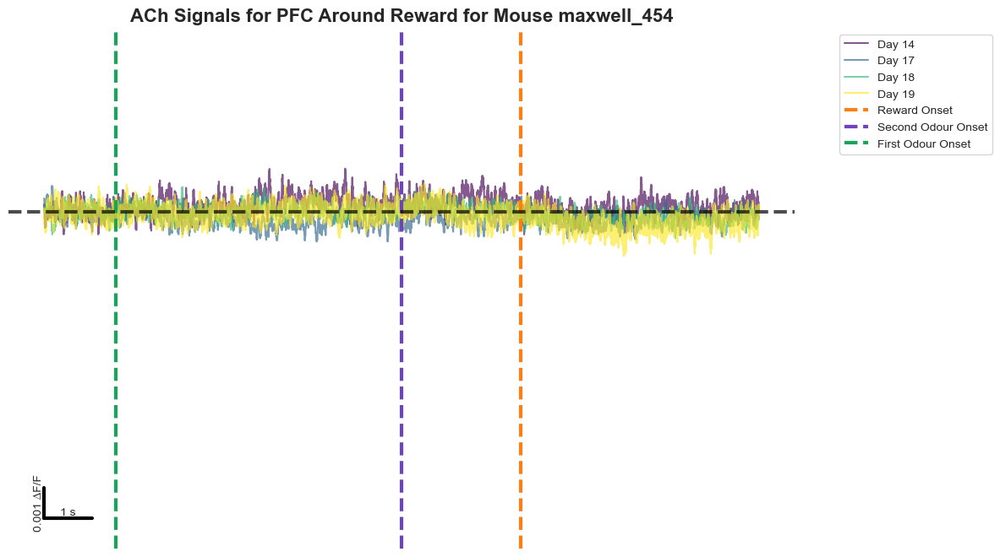

/var/folders/xc/fqjpc3c109d8130c9p4w179nnjty6s/T/ipykernel_70397/1800309637.py:109: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', len(days_of_interest))


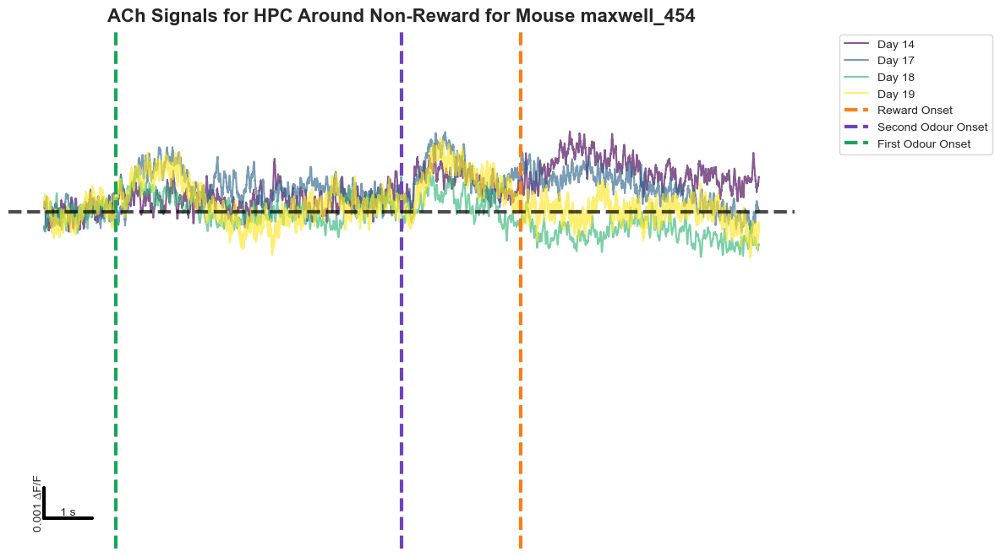

/var/folders/xc/fqjpc3c109d8130c9p4w179nnjty6s/T/ipykernel_70397/1800309637.py:109: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', len(days_of_interest))


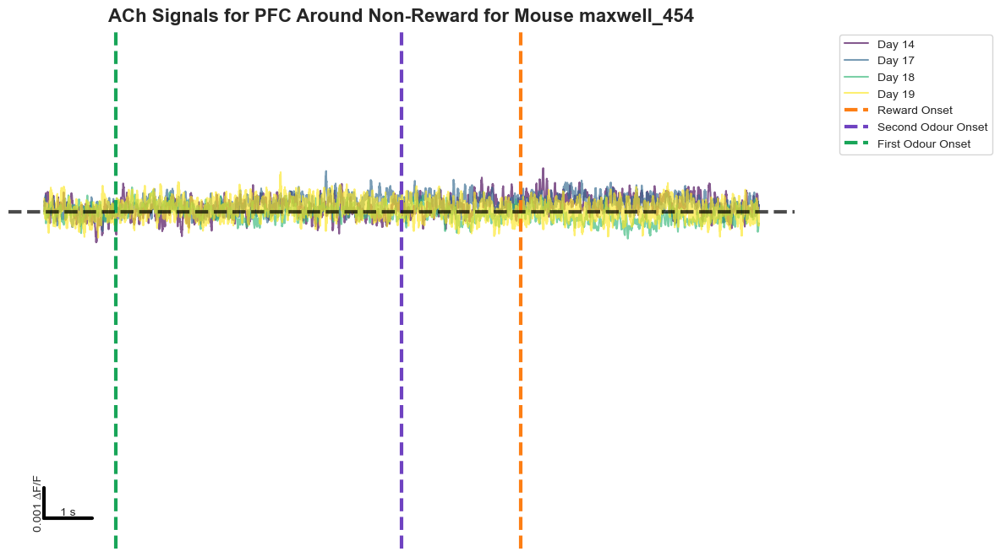

In [242]:
mouse_ids = ['maxwell_454']
# 14: 51%, 17: 56.9%, 18: 78.3% ,19:90.97%
days_of_interest = [14,17,18,19]
area_of_interest = 'HPC'
plot_average_signals_across_days(mouse_ids, days_of_interest, area_of_interest,reward_signal = True)
# 14: 51%, 17: 56.9%, 18: 78.3% ,19:90.97%
area_of_interest = 'PFC'
plot_average_signals_across_days(mouse_ids, days_of_interest, area_of_interest,reward_signal = True)

mouse_ids = ['maxwell_454']
area_of_interest = 'HPC'
plot_average_signals_across_days(mouse_ids, days_of_interest, area_of_interest,reward_signal = False)
# 14: 51%, 17: 56.9%, 18: 78.3% ,19:90.97%
area_of_interest = 'PFC'
plot_average_signals_across_days(mouse_ids, days_of_interest, area_of_interest,reward_signal = False)

/var/folders/xc/fqjpc3c109d8130c9p4w179nnjty6s/T/ipykernel_75677/4164436126.py:109: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', len(days_of_interest))


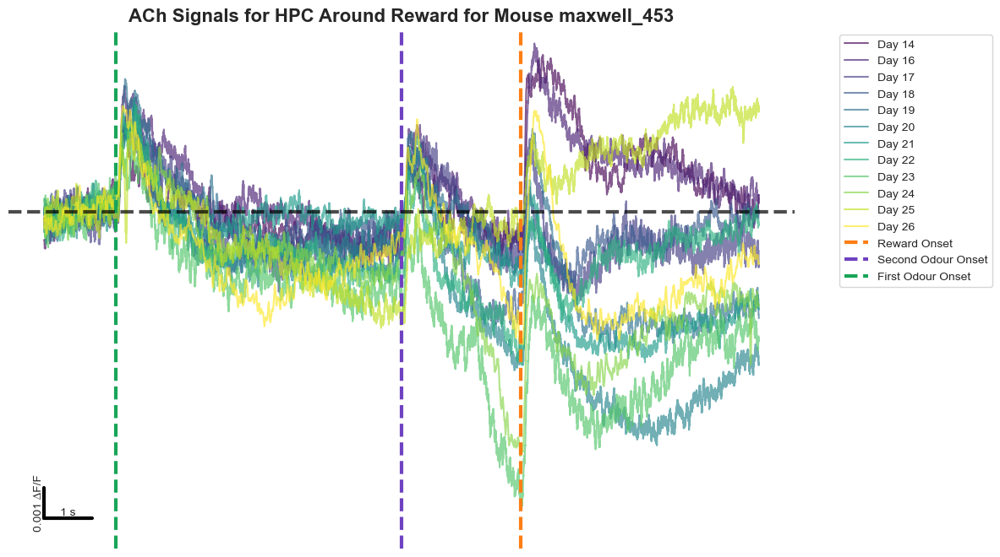

/var/folders/xc/fqjpc3c109d8130c9p4w179nnjty6s/T/ipykernel_75677/4164436126.py:109: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', len(days_of_interest))


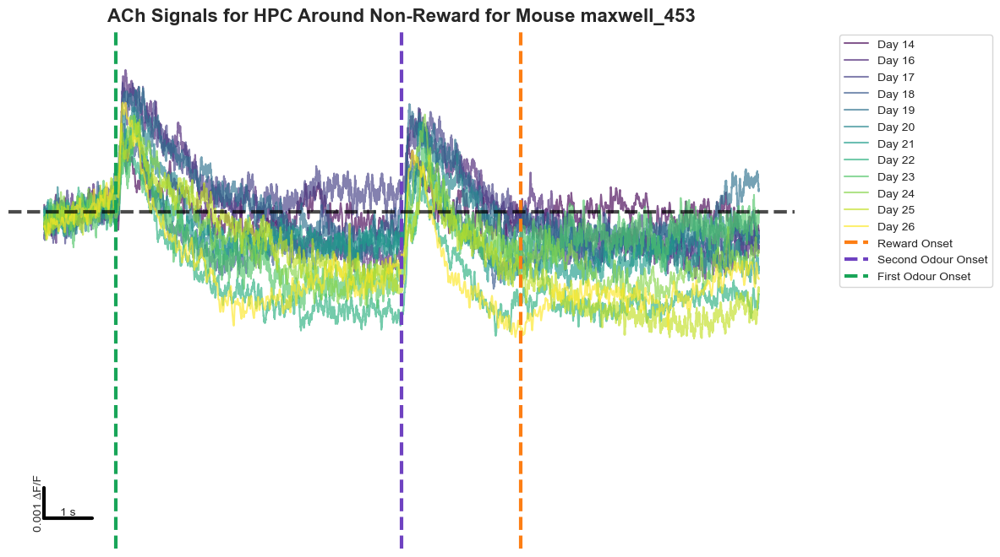

/var/folders/xc/fqjpc3c109d8130c9p4w179nnjty6s/T/ipykernel_75677/4164436126.py:109: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', len(days_of_interest))


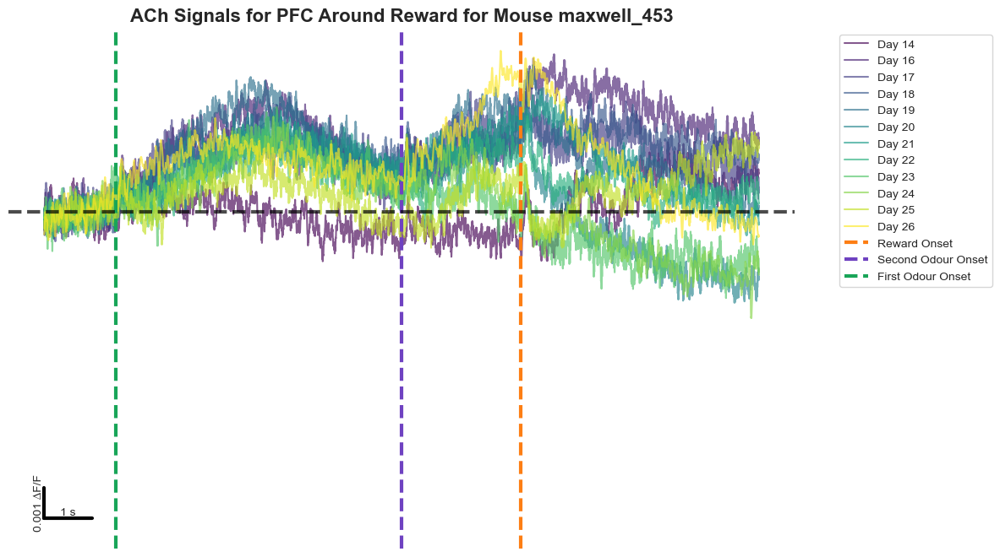

/var/folders/xc/fqjpc3c109d8130c9p4w179nnjty6s/T/ipykernel_75677/4164436126.py:109: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', len(days_of_interest))


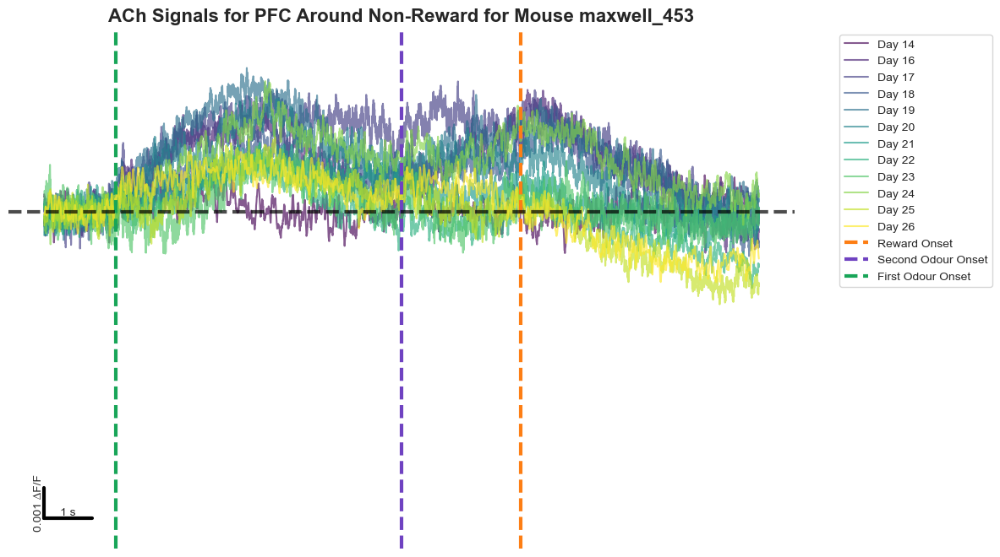

In [5]:
mouse_ids = ['maxwell_453']  # Single mouse
days_of_interest = [14,16,17,18,19,20,21,22,23,24,25,26]
area_of_interest = 'HPC'
plot_average_signals_across_days(mouse_ids, days_of_interest, area_of_interest,reward_signal = True)
mouse_ids = ['maxwell_453']  # Single mouse
area_of_interest = 'HPC'
plot_average_signals_across_days(mouse_ids, days_of_interest, area_of_interest,reward_signal = False)

mouse_ids = ['maxwell_453']  # Single mouse
days_of_interest = [14,16,17,18,19,20,21,22,23,24,25,26]
area_of_interest = 'PFC'
plot_average_signals_across_days(mouse_ids, days_of_interest, area_of_interest, reward_signal=True)
mouse_ids = ['maxwell_453']  # Single mouse
area_of_interest = 'PFC'
plot_average_signals_across_days(mouse_ids, days_of_interest, area_of_interest, reward_signal=False)

/var/folders/xc/fqjpc3c109d8130c9p4w179nnjty6s/T/ipykernel_33751/355693639.py:240: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', len(days_of_interest))


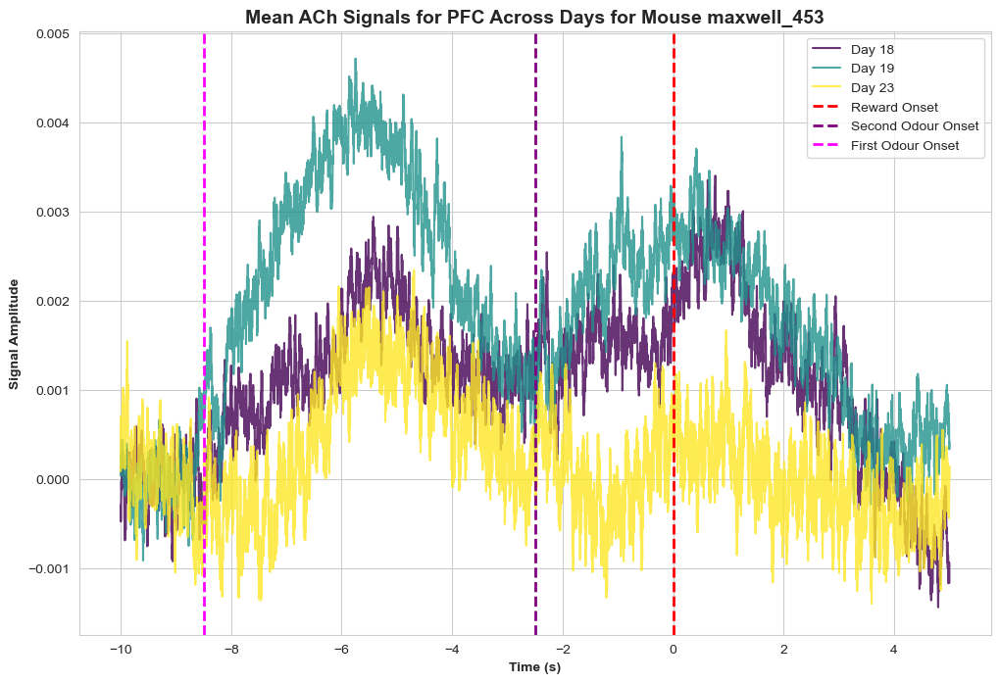

/var/folders/xc/fqjpc3c109d8130c9p4w179nnjty6s/T/ipykernel_33751/355693639.py:240: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', len(days_of_interest))


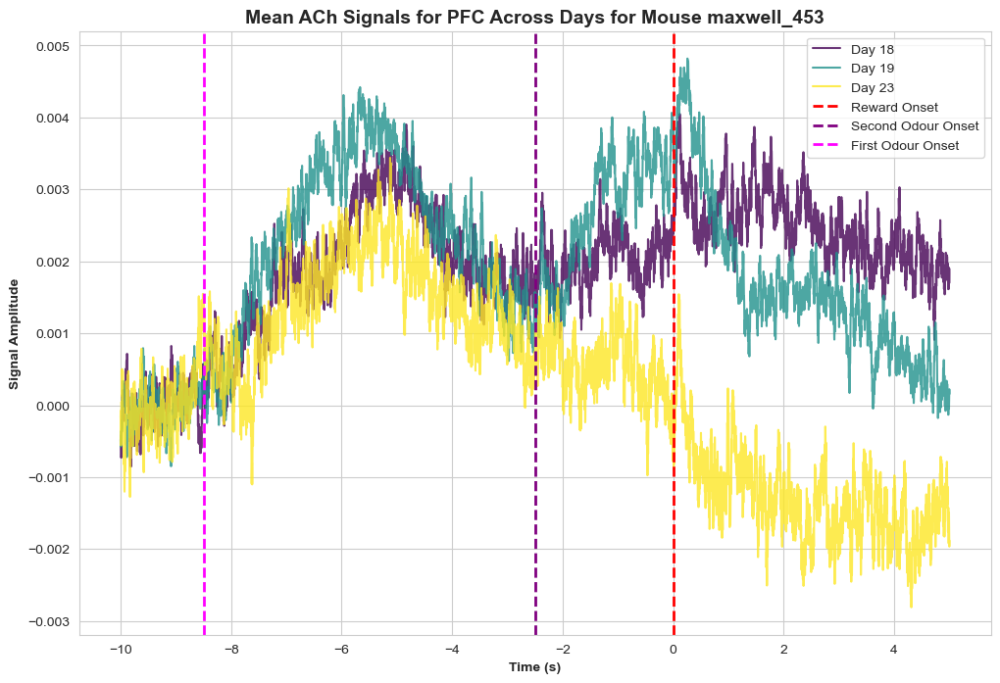

In [155]:
mouse_ids = ['maxwell_453']  # Single mouse
days_of_interest = [18,19,23]
area_of_interest = 'PFC'
plot_average_signals_across_days(mouse_ids, days_of_interest, area_of_interest,reward_signal = False)
mouse_ids = ['maxwell_453']  # Single mouse

plot_average_signals_across_days(mouse_ids, days_of_interest, area_of_interest,reward_signal = True)

# PFC is predicting the outcome value while HPC is encoding the prediction of the value 

# SO WE SHOULD POOL MULTIPLE EXPERT DAYS FOR PFC AND HPC 

# HPC predicts upcomong thinsg from external information while PFC reports the outcpmoe

In [24]:
directory_behavior = '/Users/chenx/Desktop/MacAskill Lab/Data/My_Rig_Data/Behaviour'
mouse_id = 'maxwell_453'
day = 23
maxwell_453_behaviour_df = load_and_preprocess_behavior_data(directory_behavior, mouse_id, day)

In [25]:
maxwell_453_behaviour_df

,time,odour_a,odour_b,odour_c,lick_data,water_valve
0,0.000,-0.036500,-0.040378,-0.037792,-0.020988,-0.039085
1,0.001,-0.036500,-0.036500,-0.037792,-0.017111,-0.037792
2,0.002,-0.035207,-0.037792,-0.036500,-0.023574,-0.037792
3,0.003,-0.036500,-0.036500,-0.037792,-0.020988,-0.037792
4,0.004,-0.035207,-0.037792,-0.036500,-0.017111,-0.037792
...,...,...,...,...,...,...
1775995,1775.995,-0.032622,-0.032622,3.317822,0.238826,-0.032622
1775996,1775.996,-0.031329,-0.032622,3.320407,0.240119,-0.033915
1775997,1775.997,-0.031329,-0.030037,3.319115,0.233656,-0.032622
1775998,1775.998,-0.032622,-0.032622,3.319115,0.237533,-0.032622


In [27]:
import numpy as np
#DEBUGGED BY ANDREW 
def find_signal_rises(signal, threshold=2.5):
  
    return np.where(np.diff(signal) > threshold)[0]

In [28]:
# Assuming maxwell_453_behaviour_df is a DataFrame with the odour and water valve signal data
odour_a_indices = find_signal_rises(maxwell_453_behaviour_df['odour_a'].values)
odour_b_indices = find_signal_rises(maxwell_453_behaviour_df['odour_b'].values)
odour_c_indices = find_signal_rises(maxwell_453_behaviour_df['odour_c'].values)
water_indices = find_signal_rises(maxwell_453_behaviour_df['water_valve'].values)

all_odours = sorted([('A', idx) for idx in odour_a_indices] +
                    [('B', idx) for idx in odour_b_indices] +
                    [('C', idx) for idx in odour_c_indices], key=lambda x: x[1])

In [131]:
def find_signal_rises(signal, threshold=2.5):
    return np.where(np.diff(signal) > threshold)[0]

def classify_trials(all_odours, sampling_rate=1000):
    ITI_points = int(10 * sampling_rate)  # ITI duration in data points
    #2.5 is because the odour lasts 1 second then 1.5 second later reward comes
    trace_points = int(2.5 * sampling_rate)  # Trace duration in data points

    rewarded_pairs = [('A', 'B'), ('B', 'C'), ('C', 'A')]
    non_rewarded_pairs = [('B', 'A'), ('C', 'B'), ('A', 'C')]

    rewarded_trial_indices = []
    non_rewarded_trial_indices = []

    i = 0
    while i < len(all_odours) - 1:
        current_odour, current_index = all_odours[i]
        # Ensure we have a pair to examine
        if i + 1 < len(all_odours):
            next_odour, next_index = all_odours[i + 1]

            # Check if the next odour occurs within the expected ITI duration; otherwise, it's not a valid pair
            if next_index - current_index <= ITI_points:
                trial_end_index = next_index + trace_points  # Calculate the end index after the trace period
                if (current_odour, next_odour) in rewarded_pairs:
                    rewarded_trial_indices.append((current_odour, next_odour, trial_end_index//2))
                elif (current_odour, next_odour) in non_rewarded_pairs:
                    non_rewarded_trial_indices.append((current_odour, next_odour, trial_end_index//2))
            # If the pair spans beyond the ITI, indicating perhaps an incomplete trial or start of a new one, skip ahead
            else:
                i += 1
                continue
        i += 1  # Move to the next pair for examination

    return rewarded_trial_indices, non_rewarded_trial_indices




# The output lists will include tuples of (odour_1, odour_2, index_of_odour_2+1.5*sampling raye (rewarding time)),
# where the index is based on the second odour's appearance in a pair.


In [132]:
# Assuming maxwell_453_behaviour_df is a DataFrame with the odour and water valve signal data
odour_a_indices = find_signal_rises(maxwell_453_behaviour_df['odour_a'].values)
odour_b_indices = find_signal_rises(maxwell_453_behaviour_df['odour_b'].values)
odour_c_indices = find_signal_rises(maxwell_453_behaviour_df['odour_c'].values)
# water_indices = find_signal_rises(maxwell_453_behaviour_df['water_valve'].values)

all_odours = sorted([('A', idx) for idx in odour_a_indices] +
                    [('B', idx) for idx in odour_b_indices] +
                    [('C', idx) for idx in odour_c_indices], key=lambda x: x[1])

# all_odours = filter_consecutive_odours(all_odours)

# Use the function with the combined and sorted odour events
rewarded_trial_indices, non_rewarded_trial_indices = classify_trials(all_odours, sampling_rate=1000)

In [133]:
rewarded_trial_indices

[('B', 'C', 25325),
 ('A', 'B', 34614),
 ('C', 'A', 53191),
 ('A', 'B', 62480),
 ('B', 'C', 99634),
 ('C', 'A', 108923),
 ('A', 'B', 127500),
 ('C', 'A', 146077),
 ('B', 'C', 155366),
 ('A', 'B', 183232),
 ('B', 'C', 192520),
 ('C', 'A', 220386),
 ('C', 'A', 229675),
 ('A', 'B', 238964),
 ('B', 'C', 276118),
 ('C', 'A', 285407),
 ('A', 'B', 294695),
 ('B', 'C', 322561),
 ('A', 'B', 341138),
 ('B', 'C', 359715),
 ('C', 'A', 387581),
 ('B', 'C', 406158),
 ('A', 'B', 424735),
 ('C', 'A', 443312),
 ('A', 'B', 452600),
 ('C', 'A', 461889),
 ('B', 'C', 480466),
 ('B', 'C', 508332),
 ('C', 'A', 517620),
 ('A', 'B', 554775),
 ('C', 'A', 564064),
 ('B', 'C', 573352),
 ('A', 'B', 591929),
 ('A', 'B', 647661),
 ('B', 'C', 656950),
 ('C', 'A', 666239),
 ('B', 'C', 694105),
 ('C', 'A', 712682),
 ('A', 'B', 721971),
 ('C', 'A', 740548),
 ('A', 'B', 759125),
 ('B', 'C', 768414),
 ('A', 'B', 786992),
 ('C', 'A', 824147),
 ('B', 'C', 833435),
 ('C', 'A', 842724),
 ('B', 'C', 861301),
 ('A', 'B', 879878

In [134]:
water_indices

array([  50651,   69228,  106382,  124960,  199268,  217845,  255000,
        292154,  310731,  366463,  385040,  440772,  459349,  477927,
        552236,  570813,  589390,  645122,  682276,  719430,  775161,
        812315,  849469,  886623,  905200,  923777,  960932, 1016663,
       1035240, 1109550, 1128127, 1146704, 1183858, 1295322, 1313900,
       1332477, 1388209, 1425364, 1443941, 1481096, 1518250, 1536828,
       1573984, 1648293, 1666870, 1685448, 1722602, 1759756])

In [117]:
len(non_rewarded_trial_indices)

48

In [120]:
all_odours

[('A', 4999),
 ('C', 10998),
 ('C', 23576),
 ('B', 29575),
 ('B', 42153),
 ('C', 48151),
 ('A', 60730),
 ('B', 66729),
 ('B', 79307),
 ('A', 85306),
 ('C', 97884),
 ('A', 103883),
 ('A', 116462),
 ('B', 122461),
 ('C', 135039),
 ('B', 141038),
 ('B', 153616),
 ('A', 159615),
 ('A', 172193),
 ('C', 178192),
 ('B', 190770),
 ('C', 196769),
 ('C', 209347),
 ('A', 215346),
 ('A', 227925),
 ('C', 233923),
 ('A', 246502),
 ('B', 252501),
 ('C', 265079),
 ('B', 271078),
 ('C', 283656),
 ('A', 289655),
 ('B', 302233),
 ('C', 308232),
 ('B', 320810),
 ('A', 326810),
 ('B', 339388),
 ('A', 345387),
 ('A', 357965),
 ('B', 363964),
 ('B', 376542),
 ('C', 382541),
 ('C', 395119),
 ('B', 401118),
 ('A', 413697),
 ('C', 419695),
 ('C', 432273),
 ('A', 438273),
 ('C', 450851),
 ('A', 456850),
 ('A', 469429),
 ('B', 475428),
 ('C', 488006),
 ('B', 494005),
 ('A', 506583),
 ('C', 512582),
 ('B', 525160),
 ('A', 531159),
 ('B', 543738),
 ('C', 549737),
 ('C', 562315),
 ('A', 568314),
 ('A', 580893),
 ('B